# Membros do Grupo:

# Caio Vitor Salgado da Silva Serrão
# Carlo Aleksandr
# Gustavo Davi

# Questões a serem Exploradas

## 1) Observar Tempo Médio desde a realização da compra do produto até a efetiva entrega do produto ao consumidor. Após isso, discriminar esse tempo médio por estado/região. Podemos também montar um boxplot relacionando esse tempo de entrega por estado.

## 2) Verificar se há relação entre a Região Geográfica e o Número de Pedidos em dada Região.

## 3) Verificar se há relação entre o Número de vendedores e o Número de Pedidos em uma dada Região.

## 4) Analisar a relação entre a Distância entre Vendedores e Clientes e Pontuação de Avaliação dada ao produto/pedido.

## 5) Quais são os pedidos com maior/menor distância?

## 6) Qual a distância dos pedidos com maior distância (entre vendedores e clientes)?

## 7) Verificar a relação entre a Região Geográfica e o Valor do Frete

## 8) Montar um gráfico de dispersão relacionando o escore numérico/avaliação dada ao pedido e o tempo entre a confirmação do pagamento e a entrega do produto.

## 9) Verificar se há relação entre a distância entre Vendedores e Clientes e o Tempo de Entrega do Produto.

## 10) Verificar se há relação entre a distância entre Vendedores e Clientes e o Valor do Frete.

## 11) Verificar os formatos de pagamento utilizados e verificar se há alguma predileção por algum tipo de pagamento para produtos mais baratos e/ou caros. Além disso, podemos estudar o número médio de parcelas (para opções de pagamento que tenham essa opção) e verificar se há alguma correlação significativa com o preço dos produtos.

## 12) Criar uma variável binária/booleana, verificando, para cada pedido, se ele tem ou não avaliação em comentário. Com esses dados obtidos, gerar um boxplot relacionando esta variável binária com a variável score numérico de avalição/review, verificando se há assossiação significativa entre essas duas variáveis (realizar teste de correlação R2 entre variáveis qualitativas e quantitativas.

## 13) Quando o comprador e o vendedor são da mesma cidade o frete é frequentemente igual a 0 (ou seja, não há valor de frete)? Além disso, é interessante gerar um gráfico que discrimine pedidos que não tiveram valor adicional de frente daquelas que tiveram valor adicional, com base em algum outro critério, variável de interesse.

## 14) Qual categoria de produtos possui a maior nota de avaliação? ( Lembrar de juntar categorias de produtos 'redundantes').

## 15) Produtos com maior texto de descrição tendem a gerar um número maior de vendas ? (Verificar o tipo de variável que descreve o tamanho do texto. Com essa informação em mãos, utilizar coeficientes de correlação apropriados para a variável numérica número de vendas e a variável que descreve o tamanho do texto. Interessante também elaborar um gráfico que explicite melhor a relação entre essas duas variáveis.)

## 16) Qual categoria de produtos possui em média descrição maior ? ( Mesmo desafio da questão 9)

## 18) As dimensões de um produto (peso, altura ou largura) tendem a ter um frete mais caro ? Além disso, mais demorado tender a ser a entrega?

## 19) As empresas cadastradas que têm maior quantidade de vendas (selecionar, por exemplo, as 50 primeiras) tendem a se especializar em categorias específicas de produtos, ou então possuem um grande leque de categorias?

## 20) Quais são as categorias de produtos cujos produtos têm, em média, uma maior dimensão? Produtos com maior volume tendem a ser mais caros?

## 21) Pedidos que tiveram um comentário de avalição antes mesmo do pedido ter chegado tendem a ter uma nota de avalição numérica baixa? (1 ou 2)

## 22) Qual é o número total de clientes na base de dados?

## 23) Qual é custo médio por pedido?

## 24) Quais são os 5 produtos mais vendidos?

## 25) Quais são os 3 principais estados onde os clientes estão localizados?

## 26) Qual é o vendedor com mais produtos à venda?

## 27) Qual é o produto mais caro à venda?

## 28) Qual é o mês com o maior número de pedidos?

## 29) Qual é a cidade com o maior número de clientes?

## 30) Qual é a categoria de produto mais popular?

## 31) Qual é o método de pagamento mais comum?

In [ ]:
## Importando bibiliotecas necessárias

import pandas as pd
import geopandas as gpd
import urllib.request
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns
from datetime import datetime
import numpy as np
import calendar
import matplotlib.pyplot as plt
from geopy import distance
from pandas.core.accessor import register_series_accessor
from geopy.geocoders import Nominatim
from geopy.distance import geodesic
from sklearn.metrics import r2_score
from scipy.stats import chi2_contingency




In [ ]:
## Importando bases

customers = pd.read_csv("https://raw.githubusercontent.com/edunb01/dotfiles/master/olist_customers_dataset.csv")
order_items = pd.read_csv("https://raw.githubusercontent.com/edunb01/dotfiles/master/olist_order_items_dataset.csv")
order_payments = pd.read_csv("https://raw.githubusercontent.com/edunb01/dotfiles/master/olist_order_payments_dataset.csv")
order_reviews = pd.read_csv("https://raw.githubusercontent.com/edunb01/dotfiles/master/olist_order_reviews_dataset.csv")
orders = pd.read_csv("https://raw.githubusercontent.com/edunb01/dotfiles/master/olist_orders_dataset.csv")
products = pd.read_csv("https://raw.githubusercontent.com/edunb01/dotfiles/master/olist_products_dataset.csv")
sellers = pd.read_csv("https://raw.githubusercontent.com/edunb01/dotfiles/master/olist_sellers_dataset.csv")

## O dataset abaixo foi importado do repositório em: "https://github.com/rajtulluri/Olist-business-analysis/tree/master/Original%20data"
geolocation = pd.read_csv("https://raw.githubusercontent.com/rajtulluri/Olist-business-analysis/master/Original%20data/olist_geolocation_dataset.csv")
### Importando banco de dados que contém todos os zip-code´s referentes à regiões da América do Sul para correção das latitudes e longitudes das cidades brasileiras


In [ ]:
## Gerando um dataframe como resultado da fusão dos outros para uso posterior

dados = pd.merge(orders, order_items, how = 'outer')
dados = pd.merge(dados, order_payments, how = 'outer')
dados = pd.merge(dados, order_reviews, how = 'outer')
dados = pd.merge(dados, order_items, how = 'outer')
dados = pd.merge(dados, products, how = 'outer')


## Gerando dataframes separadaos para clientes e vendedores
clientes = pd.merge(dados, customers, how = 'outer')
vendedores = pd.merge(dados, sellers, how = 'outer')

dados = pd.merge(dados, customers, how = 'outer')
dados = pd.merge(dados, sellers, how = 'outer')




In [ ]:
## Gerando matriz de correlação para variáveis numéricas para possíveis insights

q1 = dados.corr()
q1

<ipython-input-75-cc847c244467>:3: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,review_score,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_zip_code_prefix,seller_zip_code_prefix
order_item_id,1.000000,-0.060459,-0.030694,-0.002871,0.073835,0.265217,-0.129398,-0.024155,-0.015059,-0.054455,-0.004326,0.005348,0.029172,-0.009461,-0.000528,-0.018331
price,-0.060459,1.000000,0.415938,0.006839,0.277642,0.739236,-0.004492,0.018026,0.201759,0.052818,0.339367,0.145587,0.224309,0.172629,0.043158,0.088363
freight_value,-0.030694,0.415938,1.000000,0.022345,0.185674,0.373762,-0.037013,0.022628,0.096506,0.022329,0.611587,0.309672,0.393865,0.325325,0.225510,0.152086
payment_sequential,-0.002871,0.006839,0.022345,1.000000,-0.086508,-0.064467,-0.005766,-0.005581,0.009937,-0.010828,0.043985,0.048959,0.024479,0.031062,-0.021974,0.014274
payment_installments,0.073835,0.277642,0.185674,-0.086508,1.000000,0.273647,-0.040446,0.020843,0.036004,0.000118,0.177491,0.117630,0.122231,0.137857,0.056266,0.039097
payment_value,0.265217,0.739236,0.373762,-0.064467,0.273647,1.000000,-0.082343,0.002371,0.156108,0.010075,0.303326,0.138755,0.217155,0.148606,0.054519,0.069818
review_score,-0.129398,-0.004492,-0.037013,-0.005766,-0.040446,-0.082343,1.000000,-0.006239,0.010332,0.022304,-0.028622,-0.020390,-0.026405,-0.010709,-0.021886,0.026024
product_name_lenght,-0.024155,0.018026,0.022628,-0.005581,0.020843,0.002371,-0.006239,1.000000,0.090238,0.145439,0.020736,0.058652,-0.030891,0.062133,0.015804,-0.032688
product_description_lenght,-0.015059,0.201759,0.096506,0.009937,0.036004,0.156108,0.010332,0.090238,1.000000,0.117888,0.063577,0.007468,0.074121,-0.068269,0.025415,0.062260
product_photos_qty,-0.054455,0.052818,0.022329,-0.010828,0.000118,0.010075,0.022304,0.145439,0.117888,1.000000,0.021535,0.044662,-0.033464,0.006953,0.020505,-0.042118


###1) Observar Tempo Médio desde a realização da compra do produto até a efetiva entrega do produto ao consumidor. Após isso, discriminar esse tempo médio por estado/região. Podemos também montar um boxplot relacionando esse tempo de entrega por estado.

In [ ]:
## Para esse exercício, acho interessante nós utilizarmos as colunas "order_approved_at" e
## "order_delivered_customer_date", pois assim não consideramos o tempo adicional entre a realização da compra
# e a confirmação do método de pagamento.
orders['order_approved_at'] = pd.to_datetime(orders['order_approved_at'], format = '%Y-%m-%d %H:%M:%S')
orders['order_delivered_customer_date'] = pd.to_datetime(orders['order_delivered_customer_date'], format = '%Y-%m-%d %H:%M:%S')
## Computando a diferença entre essas duas variáveis em termos de dias inteiros corridos.
orders['tempo_entrega'] = (orders['order_delivered_customer_date'] - orders['order_approved_at']).dt.days
orders['tempo_entrega_integral'] = (orders['order_delivered_customer_date'] - orders['order_approved_at'])









In [ ]:
## fundindo os dataframes para encontrar um dataframe com o tempo de entrega e as cidades do comprador e vendendor
orders_customers = orders.merge(customers)
oc_order_items = orders_customers.merge(order_items)
ocoi_sellers = oc_order_items.merge(sellers)
ocois = ocoi_sellers[ocoi_sellers["order_status"] == "delivered"]
ocois = ocois.dropna()
ocois = ocois[["tempo_entrega", "tempo_entrega_integral", "customer_city", "customer_state", "seller_city", "seller_state"]]
ocois

,tempo_entrega,tempo_entrega_integral,customer_city,customer_state,seller_city,seller_state
0,8.0,8 days 10:17:58,sao paulo,SP,maua,SP
1,6.0,6 days 05:13:27,itaquaquecetuba,SP,maua,SP
2,6.0,6 days 01:54:24,jaguariuna,SP,maua,SP
3,2.0,2 days 20:41:35,osasco,SP,maua,SP
4,7.0,7 days 15:24:11,gravatai,RS,maua,SP
...,...,...,...,...,...,...
112642,10.0,10 days 06:51:09,carai,MG,paulo lopes,SC
112645,3.0,3 days 22:49:05,ferraz de vasconcelos,SP,porto ferreira,SP
112647,9.0,9 days 11:23:08,fortaleza,CE,americana,SP
112648,21.0,21 days 01:35:49,teofilo otoni,MG,sao paulo,SP


In [ ]:
## fazendo a coluna regiao para poder fazer as analises
regiao = []
for i in ocois["customer_state"]:
  if i in ["SP", "RJ", "ES", "MG"]:
    regiao.append("Sudeste")
  if i in ["SC", "RS", "PR"]:
    regiao.append("Sul")
  if i in ["GO", "DF", "MS", "MT"]:
    regiao.append("Centro-Oeste")
  if i in ["AM", "RO", "RR", "TO", "PA", "AP", "AC"]:
    regiao.append("Norte")
  if i in ["SE", "AL", "MA", "CE", "PB", "PI", "RN", "BA", "PE"]:
     regiao.append("Nordeste")

ocois["regiao"] = regiao

<ipython-input-7-9df5cb29bdd1>:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  print(ocois.groupby("customer_state").mean().sort_values("tempo_entrega"))
<ipython-input-7-9df5cb29bdd1>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  print(ocois.groupby("regiao").mean().sort_values("tempo_entrega"))
<ipython-input-7-9df5cb29bdd1>:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  order = ocois.groupby("regiao").media

                tempo_entrega
customer_state               
SP                   7.818800
PR                  10.988848
MG                  11.060791
DF                  12.043312
SC                  14.024408
RS                  14.181047
RJ                  14.269448
GO                  14.393939
MS                  14.626387
ES                  14.714157
TO                  16.432258
MT                  16.919961
PE                  17.337915
BA                  18.262558
RN                  18.399232
PI                  18.479924
RO                  18.739927
PB                  19.484642
AC                  19.692308
CE                  20.030877
SE                  20.552000
MA                  20.579474
PA                  22.760911
AL                  23.489461
AM                  25.533742
AP                  27.000000
RR                  27.413043
              tempo_entrega
regiao                     
Sudeste            9.779074
Sul               13.004850
Centro-Oeste      

Text(0.5, 1.0, 'ViolinPlot Região x Tempo de Entrega')

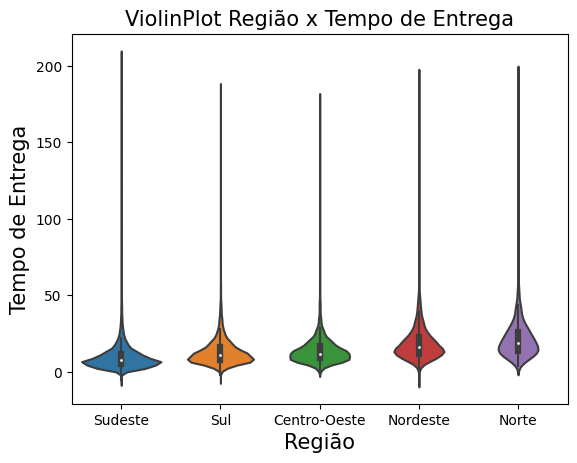

In [ ]:
# os valores medios em dias da demora de entrega tanto por estados quanto por região
print(ocois.groupby("customer_state").mean().sort_values("tempo_entrega"))
print(ocois.groupby("regiao").mean().sort_values("tempo_entrega"))
# fazendo o boxplot do tempo medio por região, ordenando pela mediana
order = ocois.groupby("regiao").median().sort_values("tempo_entrega").index
sns.violinplot(ocois, x = "regiao", y = "tempo_entrega", order = order, palette = 'tab10')
plt.xlabel('Região', fontsize = 15)
plt.ylabel('Tempo de Entrega', fontsize = 15)
plt.title('ViolinPlot Região x Tempo de Entrega', fontsize = 15)

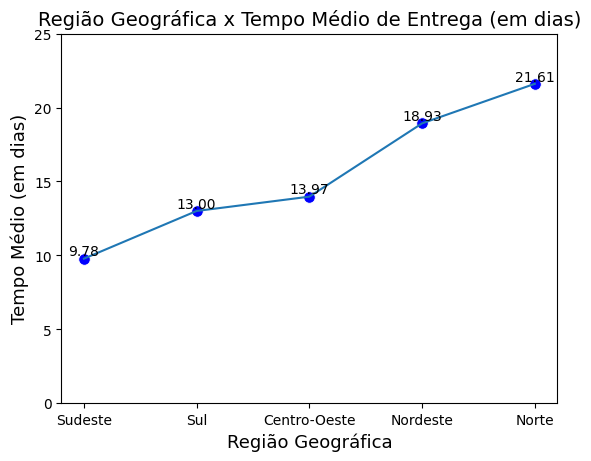

In [ ]:
a = ocois[['regiao', 'tempo_entrega']].groupby('regiao')['tempo_entrega'].agg('mean').reset_index()
a.columns = ['regiao', 'tempo_medio_entrega']
a = a.sort_values('tempo_medio_entrega')

sns.lineplot(data=a, x='regiao', y='tempo_medio_entrega')
sns.scatterplot(data=a, x='regiao', y='tempo_medio_entrega', color='blue', s=70)

for index, row in a.iterrows():
    plt.text(row['regiao'], row['tempo_medio_entrega'], f"{row['tempo_medio_entrega']:.2f}", ha='center', va='bottom')

plt.xlabel('Região Geográfica', fontsize=13)
plt.ylabel('Tempo Médio (em dias)', fontsize=13)
plt.title('Região Geográfica x Tempo Médio de Entrega (em dias)', fontsize=14)
plt.ylim(0,25)

plt.show()




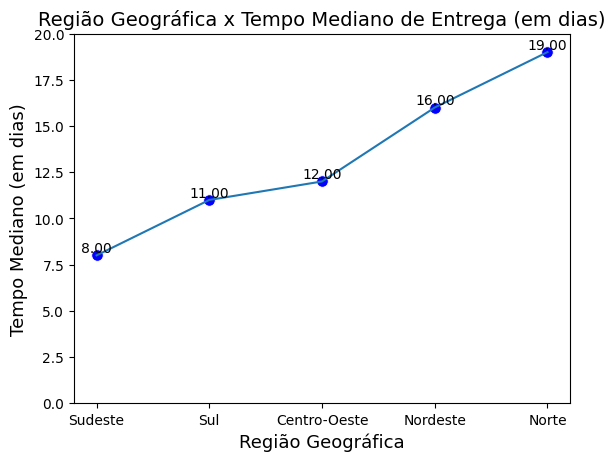

In [ ]:
b = ocois[['regiao', 'tempo_entrega']].groupby('regiao')['tempo_entrega'].agg('median').reset_index()
b.columns = ['regiao', 'tempo_mediano_entrega']
b = b.sort_values('tempo_mediano_entrega')

sns.lineplot(data=b, x='regiao', y='tempo_mediano_entrega')
sns.scatterplot(data=b, x='regiao', y='tempo_mediano_entrega', color='blue', s=70)

for index, row in b.iterrows():
    plt.text(row['regiao'], row['tempo_mediano_entrega'], f"{row['tempo_mediano_entrega']:.2f}", ha='center', va='bottom')

plt.xlabel('Região Geográfica', fontsize=13)
plt.ylabel('Tempo Mediano (em dias)', fontsize=13)
plt.title('Região Geográfica x Tempo Mediano de Entrega (em dias)', fontsize=14)
plt.ylim(0, 20)

plt.show()

## Interessante também discriminar graficamente o número de empresas cadastradas no banco de dados por região

In [ ]:
vendedores = dados.drop_duplicates(subset = 'seller_id', keep = 'first')

In [ ]:
regioes = {
    'SP': 'Sudeste', 'RJ': 'Sudeste', 'MG': 'Sudeste', 'ES': 'Sudeste',
    'RS': 'Sul', 'PR': 'Sul', 'SC': 'Sul',
    'DF': 'Centro-Oeste', 'MS': 'Centro-Oeste', 'MT': 'Centro-Oeste', 'GO': 'Centro-Oeste',
    'AM': 'Norte', 'RO': 'Norte', 'AC': 'Norte', 'AP': 'Norte', 'PA': 'Norte', 'TO': 'Norte', 'RR': 'Norte',
    'BA': 'Nordeste', 'MA': 'Nordeste', 'PI': 'Nordeste', 'SE': 'Nordeste', 'AL': 'Nordeste', 'PE': 'Nordeste', 'PB': 'Nordeste', 'RN': 'Nordeste', 'CE': 'Nordeste'
}

# Crie a coluna 'regiao_vendedor' usando o mapeamento
vendedores['regiao_vendedor'] = vendedores['seller_state'].map(regioes)



<ipython-input-11-7dce2f1d66e3>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vendedores['regiao_vendedor'] = vendedores['seller_state'].map(regioes)


## 2) Verificar se há relação entre a Região Geográfica e o Número de Pedidos em dada Região.

In [ ]:
## Criando coluna "regiões" a partir da coluna "estado do cliente"
regioes = {
    'SP': 'Sudeste', 'RJ': 'Sudeste', 'MG': 'Sudeste', 'ES': 'Sudeste',
    'RS': 'Sul', 'PR': 'Sul', 'SC': 'Sul',
    'DF': 'Centro-Oeste', 'MS': 'Centro-Oeste', 'MT': 'Centro-Oeste', 'GO': 'Centro-Oeste',
    'AM': 'Norte', 'RO': 'Norte', 'AC': 'Norte', 'AP': 'Norte', 'PA': 'Norte', 'TO': 'Norte', 'RR': 'Norte',
    'BA': 'Nordeste', 'MA': 'Nordeste', 'PI': 'Nordeste', 'SE': 'Nordeste', 'AL': 'Nordeste', 'PE': 'Nordeste', 'PB': 'Nordeste', 'RN': 'Nordeste', 'CE': 'Nordeste'
}

dados['regiao_cliente'] = dados['customer_state'].map(regioes)

In [ ]:
## Verificando o número de pedidos por região do cliente

n_pedidos_regiao = dados['regiao_cliente'].value_counts().reset_index()
n_pedidos_regiao = pd.DataFrame(n_pedidos_regiao)
n_pedidos_regiao.columns = ['Região', 'Número de Pedidos']


In [ ]:
n_pedidos_regiao

,Região,Número de Pedidos
0,Sudeste,81962
1,Sul,16961
2,Nordeste,11079
3,Centro-Oeste,6976
4,Norte,2165


In [ ]:
## Verificando a Correlação entre Número de Vendedores e Número de pedidos por região

vendedores_por_regiao = vendedores['regiao_vendedor'].value_counts().reset_index()
vendedores_por_regiao = pd.DataFrame(vendedores_por_regiao)
vendedores_por_regiao.columns = ['Região', 'Número de Vendedores']

In [ ]:
vendedores_pedidos_por_regiao = pd.merge(vendedores_por_regiao, n_pedidos_regiao, how = 'outer' )
## Obtendo a Correlação entre o Número de Vendedores e Número de Pedidos por Região
# Usando o método spearman
calc = vendedores_pedidos_por_regiao
calc.corr(method = 'pearson')


<ipython-input-15-ee5df893b692>:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  calc.corr(method = 'pearson')


,Número de Vendedores,Número de Pedidos
Número de Vendedores,1.000000,0.986371
Número de Pedidos,0.986371,1.000000


In [ ]:
## Coeficiente de Spearman
calc.corr(method = 'spearman')

<ipython-input-16-05b8daeaa741>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  calc.corr(method = 'spearman')


,Número de Vendedores,Número de Pedidos
Número de Vendedores,1.0,0.9
Número de Pedidos,0.9,1.0


In [ ]:
## Coeficiente de Kendall
calc.corr(method = 'kendall')


<ipython-input-17-3434c0108b99>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  calc.corr(method = 'kendall')


,Número de Vendedores,Número de Pedidos
Número de Vendedores,1.0,0.8
Número de Pedidos,0.8,1.0


In [ ]:
vendedores_pedidos_por_regiao

,Região,Número de Vendedores,Número de Pedidos
0,Sudeste,2287,81962
1,Sul,668,16961
2,Centro-Oeste,79,6976
3,Nordeste,56,11079
4,Norte,5,2165


## 3) Verificar se há relação entre o Número de vendedores e o Número de Pedidos em uma dada Região.

[Text(0, 0, '2165'),
 Text(0, 0, '6976'),
 Text(0, 0, '11079'),
 Text(0, 0, '16961'),
 Text(0, 0, '81962')]

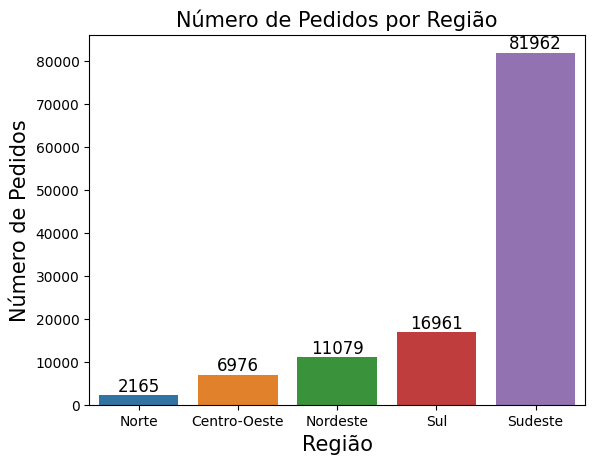

In [ ]:
graf = sns.barplot(data = vendedores_por_regiao,
            x = calc['Região'], y = calc['Número de Pedidos'],
            order = calc.sort_values('Número de Pedidos').Região,
            palette = 'tab10' )

plt.xlabel("Região", fontsize = 15)
plt.ylabel("Número de Pedidos", fontsize = 15)
plt.title("Número de Pedidos por Região", fontsize = 15)
graf.bar_label(graf.containers[0], fontsize=12)

[Text(0, 0, '5'),
 Text(0, 0, '56'),
 Text(0, 0, '79'),
 Text(0, 0, '668'),
 Text(0, 0, '2287')]

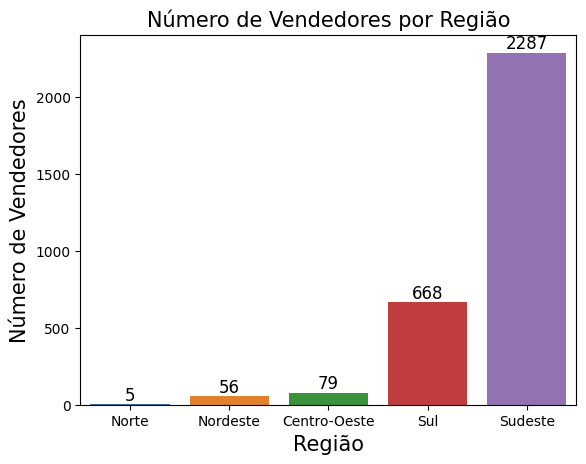

In [ ]:
graf = sns.barplot(data = vendedores_por_regiao,
            x = calc['Região'], y = calc['Número de Vendedores'],
            order = calc.sort_values('Número de Vendedores').Região,
            palette = 'tab10')
plt.xlabel("Região", fontsize = 15)
plt.ylabel("Número de Vendedores", fontsize = 15)
plt.title("Número de Vendedores por Região", fontsize = 15)
graf.bar_label(graf.containers[0], fontsize=12)




### Tal como imaginado, existe uma tendência fortíssima de regiões com maior número de vendedores se correlacionarem com maior volume de pedidos

## Inserindo também mapas que ressaltam a distribuição de pedidos e vendedores pelo Brasil

In [ ]:
## Gerando dataframe do merge entre o df orders e customers para uso posterior
customers_orders = pd.merge(orders, customers, how = 'left', on = 'customer_id')
## Obtendo colunas do dataframe order_reviews para uso posterior
customers_orders = pd.merge(customers_orders, order_reviews, how = 'left', on = 'order_id')
## Obtendo colunas do dataframe order_items para uso posterior
customers_orders = pd.merge(customers_orders, order_items, how = 'left', on= 'order_id')


In [ ]:



# Definindo função que converte latitude e longitude (do dataframe geolocation) para graus decimais
def angle_to_decimal(angle):
    parts = angle.split()
    degrees = float(parts[0])
    minutes = float(parts[1])
    seconds = float(parts[2]) if len(parts) == 3 else 0
    return degrees + minutes / 60 + seconds / 3600

## Coordenadas extremas do território brasileiro
lat_norte = "5 16 27.8"
lat_sul = "33 45 04.21"
long_oeste = "73 58 58.19"
long_leste = "34 47 35.33"

# Convertendo ângulos para graus decimais
graus_decimais_norte = angle_to_decimal(lat_norte)
graus_decimais_sul = -angle_to_decimal(lat_sul)  # Negativo/ Menor que 0 para Latitude Sul
graus_decimais_oeste = -angle_to_decimal(long_oeste)   # Negativo/ Menor que 0 para Longitude Oeste
graus_decimais_leste = angle_to_decimal(long_leste)

# Inicilizando o geocode
geolocator = Nominatim(user_agent="trabce2")

# Função para obter os dados de geolocalização obtíveis a partir de um zip-code
def fetch_geolocation(zip_code):
    location = geolocator.geocode(zip_code)
    return {
        "geolocation_zip_code_prefix": zip_code,
        "geolocation_lat": location.latitude if location else None,
        "geolocation_lng": location.longitude if location else None
    }


# Mantendo somente pedidos cujas latitudes e longitudes se encontrem em território brasileiro:
geo = geolocation[
    (geolocation["geolocation_lat"] <= graus_decimais_norte) &
    (geolocation["geolocation_lat"] >= graus_decimais_sul) &
    (geolocation["geolocation_lng"] <= graus_decimais_leste) &
    (geolocation["geolocation_lng"] >= graus_decimais_oeste)
]

geo = geo.groupby("geolocation_zip_code_prefix").agg("min").reset_index()

# Aplicando merge entre o dataframe orders e geolocation
customers_orders = pd.merge(customers_orders, geo, how="left", left_on="customer_zip_code_prefix", right_on="geolocation_zip_code_prefix")
# Adicionando coluna 'região' que agrupa os estados de acordo com suas regiões geográficas
customers_orders['regiao'] = customers_orders['customer_state'].map(regioes)
# Aplicando merge o dataframe sellers e geolocation
sellers_geo = pd.merge(sellers, geo, how = 'left', left_on ='seller_zip_code_prefix', right_on = 'geolocation_zip_code_prefix')



In [ ]:
customers_orders = customers_orders.rename(columns = {'geolocation_lat': 'customer_lat', 'geolocation_lng': 'customer_long'})
sellers_geo = sellers_geo.rename(columns = {'geolocation_lat': 'seller_lat', 'geolocation_lng': 'seller_long'})

In [ ]:
## Mapa Distribuição de Pedidos pelo Brasil
data = customers_orders

import plotly.express as px

fig = px.scatter_mapbox(data, lat = data['customer_lat'], lon= data['customer_long'],
                        color_discrete_sequence=["fuchsia"], zoom=3, height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0},
                  height = 800,
                  width = 1200,
                  title = 'Distribuição de Pedidos pelo Brasil'
                  )
fig.show()

In [ ]:
sellers_geo = pd.merge(sellers_geo, order_items, how = 'left', on = 'seller_id')

In [ ]:
sellers_geo = pd.merge(sellers_geo, orders, how = 'left', on = 'order_id')

In [ ]:
## Mapa Distribuição de Vendedores pelo Brasil
data = sellers_geo

import plotly.express as px

fig = px.scatter_mapbox(data, lat = sellers_geo['seller_lat'], lon= sellers_geo['seller_long'],
                        color_discrete_sequence=["fuchsia"], zoom=3, height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0},
                  height = 800,
                  width = 1200,
                  title = 'Distribuição de Vendedores pelo Brasil'
                  )
fig.show()

In [ ]:
co = customers_orders[['order_id', 'customer_id', 'customer_unique_id', 'customer_city', 'customer_state', 'customer_lat', 'customer_long', 'tempo_entrega', 'review_score', 'price', 'freight_value']]

In [ ]:
co['regiao'] = co['customer_state'].map(regioes)

<ipython-input-28-59940fe64c4e>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
sg = sellers_geo[['seller_id', 'seller_city', 'seller_state', 'seller_lat','seller_long', 'order_id']]

In [ ]:
## Fundindo os dataframes customers_orders e sellers_geo para cálculo da distância entre vendedores e clientes
dist_orders = pd.merge(co, sg, how = 'inner', on = 'order_id')

In [ ]:
dist_orders[['seller_lat', 'seller_long', 'customer_lat', 'customer_long', 'tempo_entrega', 'review_score', 'price', 'freight_value']] = dist_orders[[
    'seller_lat', 'seller_long', 'customer_lat', 'customer_long', 'tempo_entrega', 'review_score', 'price', 'freight_value'
]].apply(pd.to_numeric, errors='coerce')

In [ ]:
## Filtrando pedidos que possuem Na`s nas latitudes e/ou longitudes dos clientes e/ou vendedores

dist_orders = dist_orders.dropna(subset=['seller_lat', 'seller_long', 'customer_lat', 'customer_long', 'tempo_entrega', 'review_score', 'price', 'freight_value'])

In [ ]:

## Testando pacote que contém modelos que consideram a Terra como um Elipsoide para estimar a distância entre dois pontos
## a partir de suas latitudes e longitudes

### Tupla que recebe latitude e longitude de posições na superfície terreste
teste1 = (-22.877098458566866, -42.98639206073936)
teste2 = (-8.275688986679697, -35.96561521924186)

## Verificando a distância entre as posições dadas

print(distance.distance(teste1, teste2).km)

1781.5673338154522


In [ ]:
## Criando coluna distância (entre vendedores e clientes)
dist_orders['distance'] = dist_orders.apply(
    lambda row: geodesic((row['seller_lat'], row['seller_long']), (row['customer_lat'], row['customer_long'])).km,
    axis=1
)

##4) Verificar a distribuição das empresas de acordo com seu estado. Verificar se entregas realizadas entre locais de maior distância se correlacionam com um menor score de avalição do produto.

Text(0.5, 1.0, 'Distância entre Vendedores e Clientes X Pontuação Review')

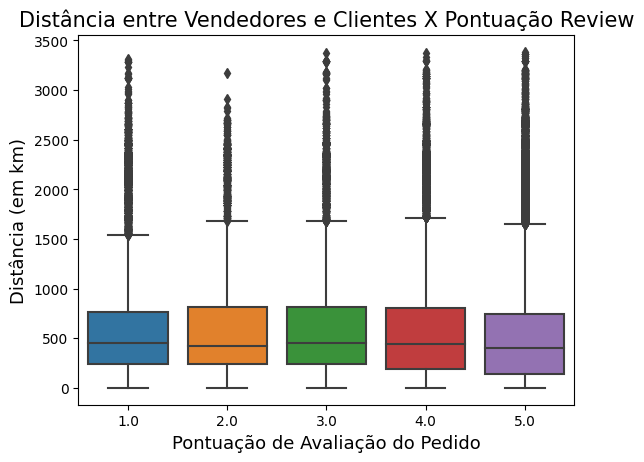

In [ ]:
## Verificando Correlação entre Distância e Review_Score

sns.boxplot(dist_orders, x = dist_orders['review_score'], y = dist_orders['distance'])
plt.xlabel('Pontuação de Avaliação do Pedido', fontsize = 13)
plt.ylabel('Distância (em km)', fontsize = 13)
plt.title('Distância entre Vendedores e Clientes X Pontuação Review', fontsize = 15)

([<matplotlib.axis.XTick at 0x7be37dc21a50>,
 [Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5')])

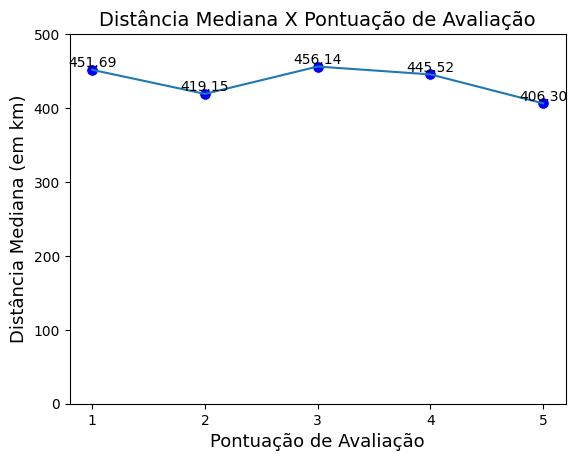

In [ ]:
g = dist_orders.groupby('review_score')['distance'].agg(['median']).reset_index()
g.columns = ['review_score', 'distancia_mediana']
sns.lineplot(data = g, x = 'review_score', y = 'distancia_mediana')
sns.scatterplot(data=g, x='review_score', y='distancia_mediana', color='blue', s=70)
for index, row in g.iterrows():
    plt.text(row['review_score'], row['distancia_mediana'], f"{row['distancia_mediana']:.2f}", ha='center', va='bottom')
plt.ylim(0,500)
plt.xlabel('Pontuação de Avaliação', fontsize = 13)
plt.ylabel('Distância Mediana (em km)', fontsize = 13)
plt.title('Distância Mediana X Pontuação de Avaliação', fontsize = 14)
plt.xticks([1,2,3,4,5])


([<matplotlib.axis.XTick at 0x7be37dc6e440>,
 [Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5')])

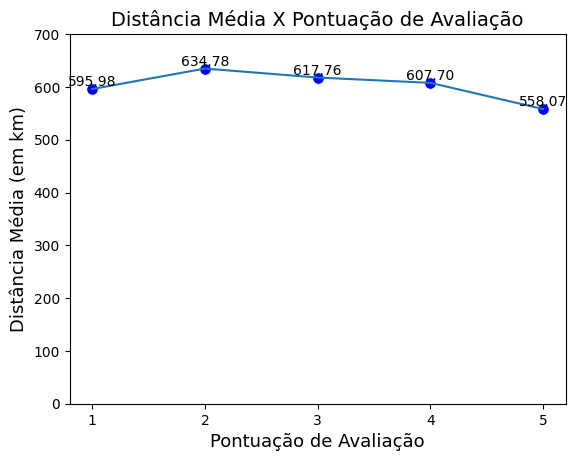

In [ ]:
h = dist_orders.groupby('review_score')['distance'].agg(['mean']).reset_index()
h.columns = ['review_score', 'distancia_media']
sns.lineplot(data = h, x = 'review_score', y = 'distancia_media')
sns.scatterplot(data=h, x='review_score', y='distancia_media', color='blue', s=70)
for index, row in h.iterrows():
    plt.text(row['review_score'], row['distancia_media'], f"{row['distancia_media']:.2f}", ha='center', va='bottom')
plt.ylim(0, 700)
plt.xlabel('Pontuação de Avaliação', fontsize = 13)
plt.ylabel('Distância Média (em km)', fontsize = 13)
plt.title('Distância Média X Pontuação de Avaliação', fontsize = 14)
plt.xticks([1,2,3,4,5])

## Julgando pelos gráficos, a distância entre vendedores e clientes parece não ter grande influência sobre a pontuação de avaliação (sem discriminar entre pedidos que atrasaram e que chegaram no prazo);

Text(0.5, 1.0, 'Top 100 Pedidos com maior distância: Tempo de Entrega X Pontuação Review')

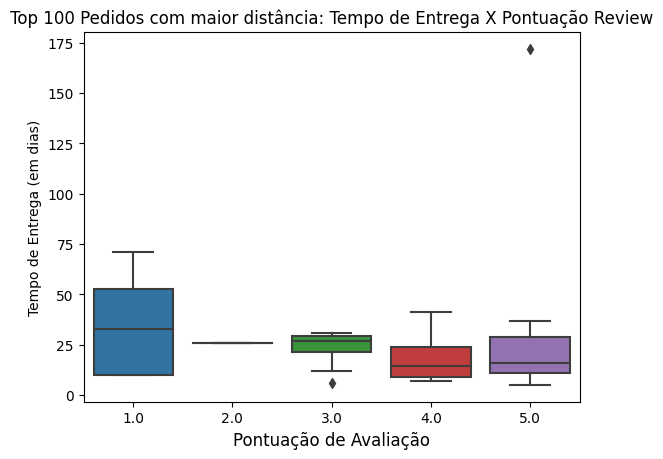

In [ ]:
### Obtendo as viagens mais longas

vml = dist_orders.sort_values('distance', ascending = False).head(n=100)
sns.boxplot(data = vml, y = 'tempo_entrega', x = 'review_score')
plt.xlabel('Pontuação de Avaliação', fontsize = 12)
plt.ylabel('Tempo de Entrega (em dias)')
plt.title('Top 100 Pedidos com maior distância: Tempo de Entrega X Pontuação Review')

In [ ]:
tabela_vml = vml[['tempo_entrega', 'review_score']].groupby('review_score').count()
tabela_vml

,tempo_entrega
review_score,
1.0,10
2.0,1
3.0,19
4.0,24
5.0,46


Text(0.5, 1.0, 'Top 100 Pedidos com Menor Deslocamento: Tempo de Entrega X Pontuação Review')

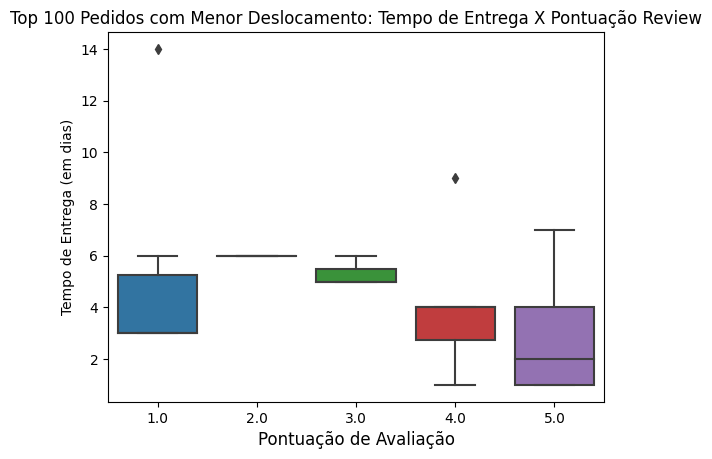

In [ ]:
## Obtendo as 100 viagens mais curtas

vmc = dist_orders.sort_values('distance', ascending = True).head(n=100)
sns.boxplot(data = vmc, y = 'tempo_entrega', x = 'review_score')
plt.xlabel('Pontuação de Avaliação', fontsize = 12)
plt.ylabel('Tempo de Entrega (em dias)')
plt.title('Top 100 Pedidos com Menor Deslocamento: Tempo de Entrega X Pontuação Review')

In [ ]:
tabela_vmc = vmc[['review_score', 'tempo_entrega']].groupby('review_score').count()
tabela_vmc

,tempo_entrega
review_score,
1.0,6
2.0,4
3.0,3
4.0,8
5.0,79


In [ ]:
import plotly.graph_objects as go
### Gráfico que será usado como modelo para mostrar os trajetos entre vendedores e clientes(
#   ie, o trajeto entre o local de saída do produto até o endereço de entrega dado pelo cliente)

# Create traces for lines and markers
traces = []
for i, row in vml.iterrows():
    seller_location = {'lat': row['seller_lat'], 'lon': row['seller_long']}
    customer_location = {'lat': row['customer_lat'], 'lon': row['customer_long']}

    # Create a line trace between seller and customer
    trace_line = go.Scattermapbox(
        mode='lines',
        lon=[seller_location['lon'], customer_location['lon']],
        lat=[seller_location['lat'], customer_location['lat']],
        line=dict(width=2),
        marker=dict(size=10),
        name=f'Distância {row["distance"]}km'
    )
    traces.append(trace_line)

    # Create markers for sellers and customers
    trace_seller = go.Scattermapbox(
        mode='markers+text',
        lon=[seller_location['lon']],
        lat=[seller_location['lat']],
        marker=dict(size=10, symbol='circle', color='blue'),  # Use a circle marker for sellers
        text=f'Seller {row["seller_id"]}',  # Add text to identify sellers
        showlegend=False
    )
    traces.append(trace_seller)

    trace_customer = go.Scattermapbox(
        mode='markers+text',
        lon=[customer_location['lon']],
        lat=[customer_location['lat']],
        marker=dict(size=10, symbol='square', color='red'),  # Use a square marker for customers
        text=f'Customer {row["customer_id"]}',  # Add text to identify customers
        showlegend=False
    )
    traces.append(trace_customer)

# Add legend to explain symbols
trace_legend = go.Scattermapbox(
    lon=[],
    lat=[],
    marker=dict(size=10, symbol='circle', color='blue'),
    name='Seller',
    mode='markers',
    text=['Seller Legend'],
    showlegend=True
)
traces.append(trace_legend)

trace_legend = go.Scattermapbox(
    lon=[],
    lat=[],
    marker=dict(size=10, symbol='square', color='red'),
    name='Customer',
    mode='markers',
    text=['Customer Legend'],
    showlegend=True
)
traces.append(trace_legend)

# Create the layout for the map
layout = go.Layout(
    mapbox=dict(
        style="carto-positron",
        zoom=3,
        center=dict(lat=vml['seller_lat'].mean(), lon=vml['seller_long'].mean())
    ),
    showlegend=True,
    height=600,
    width=800,
    title='Top 20 Pedidos com Maior Distância'
)

# Create the figure and display it
fig = go.Figure(data=traces, layout=layout)
fig.show()

## Verificando a Relação entre o Valor do Frete a Região do Cliente

Text(0.5, 1.0, 'Região Geográfica x Valor do Frete (em R$)')

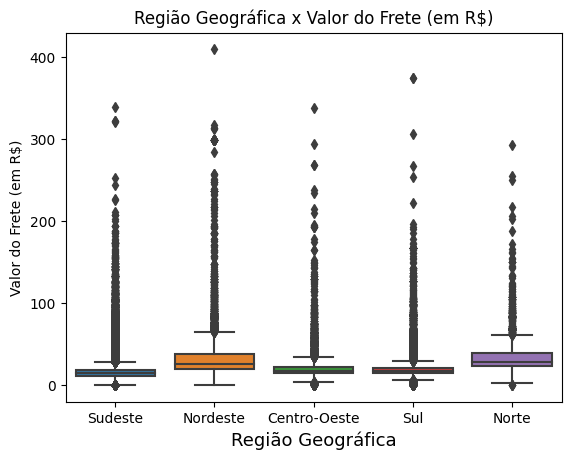

In [ ]:
sns.boxplot(data = dist_orders, x = 'regiao', y = 'freight_value')
plt.xlabel('Região Geográfica', fontsize = 13)
plt.ylabel('Valor do Frete (em R$)')
plt.title('Região Geográfica x Valor do Frete (em R$)')

In [ ]:
d = dist_orders[['regiao', 'freight_value']].groupby('regiao').aggregate('mean').reset_index()
d.columns = ['regiao', 'media_frete']
d = d.sort_values('media_frete')

Text(0.5, 1.0, 'Valor Médio do Frete (R$) x Região Geográfica')

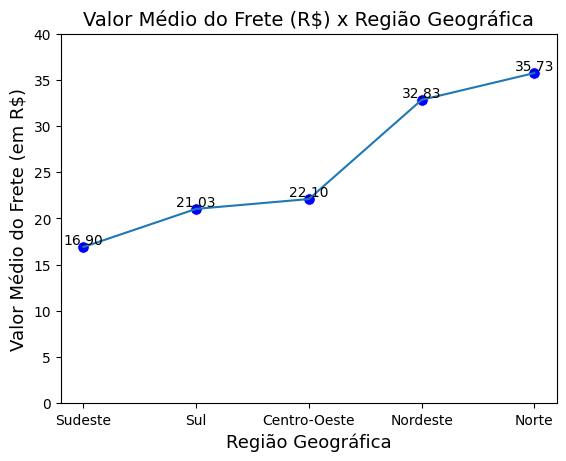

In [ ]:
sns.lineplot(data = d, x = 'regiao', y = 'media_frete')
sns.scatterplot(data = d, x = 'regiao', y = 'media_frete', color = 'blue', s = 70)
for index, row in d.iterrows():
    plt.text(row['regiao'], row['media_frete'], f"{row['media_frete']:.2f}", ha='center', va='bottom')
plt.ylim(0, 40)
plt.xlabel('Região Geográfica', fontsize = 13)
plt.ylabel('Valor Médio do Frete (em R$)', fontsize = 13)
plt.title('Região Geográfica x Valor do Frete (em R$)', fontsize = 14)

In [ ]:
f = dist_orders[['regiao', 'freight_value']].groupby('regiao').aggregate('median').reset_index()
f.columns = ['regiao', 'mediana_frete']
f = f.sort_values('mediana_frete')

Text(0.5, 1.0, 'Valor Mediano do Frete (R$) x Região Geográfica')

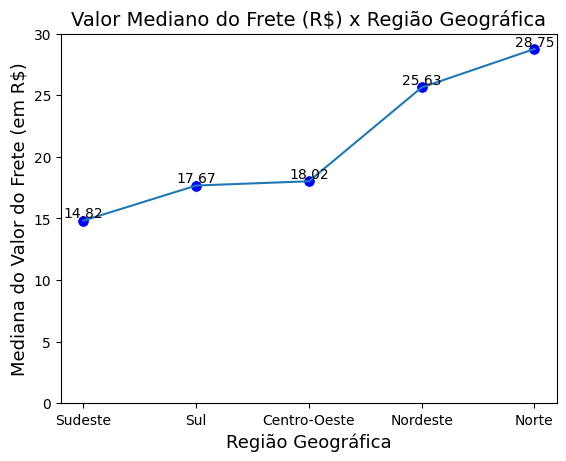

In [ ]:
sns.lineplot(data = f, x = 'regiao', y = 'mediana_frete')
sns.scatterplot(data = f, x = 'regiao', y = 'mediana_frete', color = 'blue', s = 70)
for index, row in f.iterrows():
    plt.text(row['regiao'], row['mediana_frete'], f"{row['mediana_frete']:.2f}", ha='center', va='bottom')
plt.ylim(0, 30)
plt.xlabel('Região Geográfica', fontsize = 13)
plt.ylabel('Mediana do Valor do Frete (em R$)', fontsize = 13)
plt.title('Região Geográfica x Valor Mediano do Frete (em R$)', fontsize = 14)







## Julgando pelos gráficos, parece haver dependência estatisticamente significativa entre a Região Geográfica e o Tempo do Frete

## 2) Montar um gráfico de dispersão relacionando o escore numérico/avaliação dada ao pedido e o tempo entre a compra e a entrega do produto.

In [ ]:
df = pd.merge(orders, order_reviews, how = 'outer')
df = df[["review_score", "order_approved_at", "order_delivered_customer_date"]]
df = df.dropna()
df


,review_score,order_approved_at,order_delivered_customer_date
0,4.0,2017-10-02 11:07:15,2017-10-10 21:25:13
1,4.0,2018-07-26 03:24:27,2018-08-07 15:27:45
2,5.0,2018-08-08 08:55:23,2018-08-17 18:06:29
3,5.0,2017-11-18 19:45:59,2017-12-02 00:28:42
4,5.0,2018-02-13 22:20:29,2018-02-16 18:17:02
...,...,...,...
99987,5.0,2017-03-09 09:54:05,2017-03-17 15:08:01
99988,4.0,2018-02-06 13:10:37,2018-02-28 17:37:56
99989,5.0,2017-08-27 15:04:16,2017-09-21 11:24:17
99990,2.0,2018-01-08 21:36:21,2018-01-25 23:32:54


In [ ]:
data_compra = pd.to_datetime(df['order_approved_at'], format='%Y-%m-%d %H:%M:%S')
data_compra_dias = data_compra.dt.year*365 + data_compra.dt.month*30 + data_compra.dt.day + (data_compra.dt.hour + data_compra.dt.minute/60 + data_compra.dt.second/3600)/24
data_entrega = pd.to_datetime(df['order_delivered_customer_date'], format='%Y-%m-%d %H:%M:%S')
data_entrega_dias = data_entrega.dt.year*365 + data_entrega.dt.month*30 + data_entrega.dt.day + (data_entrega.dt.hour + data_entrega.dt.minute/60 + data_entrega.dt.second/3600)/24
df['tempo_entrega'] = data_entrega_dias - data_compra_dias

Text(0, 0.5, 'Tempo de Entrega (em dias)')

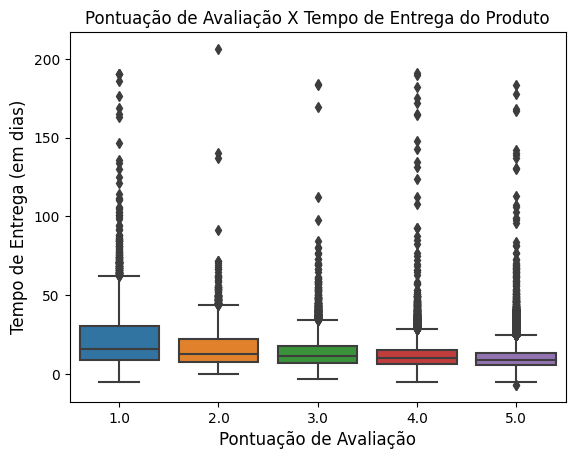

In [ ]:
## Aqui utilizei um boxplot, ao invés de um gráfico de dispersão, pois como a variável de avalição numérica tem somente
# 5 respostas possíveis, achei mais apropriado tratá-la como uma variável categórica;



sns.boxplot(df, y= df['tempo_entrega'], x= df['review_score'])
plt.title('Pontuação de Avaliação X Tempo de Entrega do Produto')
plt.xlabel('Pontuação de Avaliação', fontsize = 12)
plt.ylabel('Tempo de Entrega (em dias)', fontsize = 12)

(0.0, 22.0)

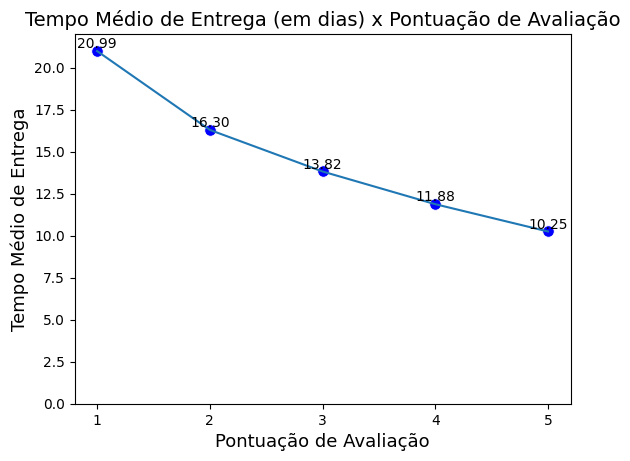

In [ ]:
j = df[['review_score', 'tempo_entrega']].groupby('review_score').agg('mean').reset_index()
j.columns = ['review_score', 'tempo_medio']
j = j.sort_values('tempo_medio')

sns.lineplot(data = j, x = 'review_score', y = 'tempo_medio')
sns.scatterplot(data = j, x = 'review_score', y = 'tempo_medio', color = 'blue', s = 70)
for index, row in j.iterrows():
    plt.text(row['review_score'], row['tempo_medio'], f"{row['tempo_medio']:.2f}", ha='center', va='bottom')
plt.xlabel('Pontuação de Avaliação', fontsize = 13)
plt.ylabel('Tempo Médio de Entrega', fontsize = 13)
plt.title('Tempo Médio de Entrega (em dias) x Pontuação de Avaliação', fontsize = 14)
plt.xticks([1,2,3,4,5])
plt.ylim(0,22)


(0.0, 18.0)

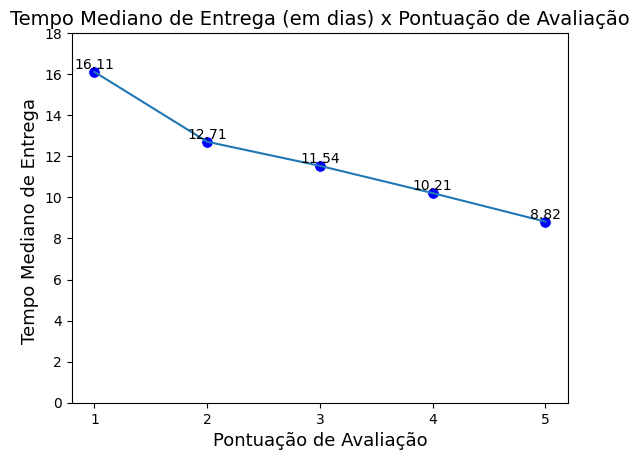

In [ ]:
k = df[['review_score', 'tempo_entrega']].groupby('review_score').agg('median').reset_index()
k.columns = ['review_score', 'tempo_mediano']
k = k.sort_values('tempo_mediano')

sns.lineplot(data = k, x = 'review_score', y = 'tempo_mediano')
sns.scatterplot(data = k, x = 'review_score', y = 'tempo_mediano', color = 'blue', s = 70)
for index, row in k.iterrows():
    plt.text(row['review_score'], row['tempo_mediano'], f"{row['tempo_mediano']:.2f}", ha='center', va='bottom')
plt.xlabel('Pontuação de Avaliação', fontsize = 13)
plt.ylabel('Tempo Mediano de Entrega ', fontsize = 13)
plt.title('Tempo Mediano de Entrega (em dias) x Pontuação de Avaliação', fontsize = 14)
plt.xticks([1,2,3,4,5])
plt.ylim(0,18)

In [ ]:
## Mensurando a correlação entre essas duas variáveis
from sklearn.metrics import r2_score

r2_score(df['tempo_entrega'], df['review_score'])

-0.7979599356822764

## Com valor R2 negativo arbitrariamente grande, há evidências de que entregas com tempo maior de entrega conduzem a menor pontuação de avaliação.

## 3) Relação entre Distância entre Vendedores e Clientes e o Tempo de Entrega

## Verificando também a correlação entre Distância e Tempo de Entrega

Text(0.5, 1.0, 'Distância entre Vendedor e Cliente X Tempo de Entrega')

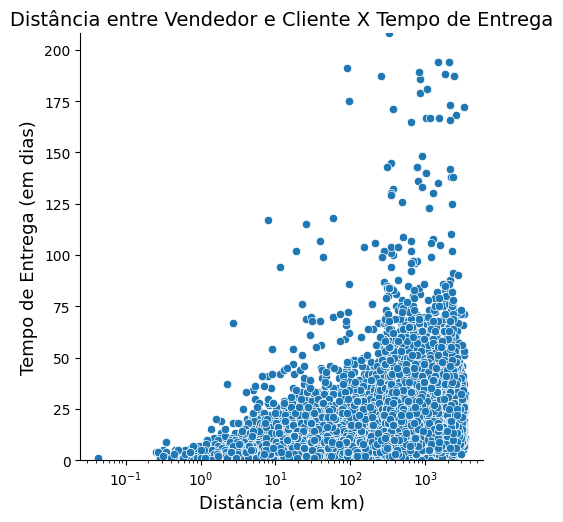

In [ ]:
import matplotlib.pyplot as plt
sns.relplot(data = dist_orders, y = dist_orders['tempo_entrega'], x = dist_orders['distance'])
plt.xscale('log')
plt.ylim([0, max(dist_orders['tempo_entrega'])])
plt.xlabel('Distância (em km)', fontsize = 13)
plt.ylabel('Tempo de Entrega (em dias)',fontsize = 13)
plt.title('Distância entre Vendedor e Cliente X Tempo de Entrega', fontsize = 14)

## Distância em escala logarítmica


In [ ]:
## Mensurando numericamente a relação entre essas duas variáveis

## Método Spearman
dist_orders[['distance', 'tempo_entrega']].corr(method='spearman')

,distance,tempo_entrega
distance,1.000000,0.522223
tempo_entrega,0.522223,1.000000


In [ ]:
## Método Pearson
dist_orders[['distance', 'tempo_entrega']].corr(method = 'pearson')

,distance,tempo_entrega
distance,1.000000,0.393254
tempo_entrega,0.393254,1.000000


In [ ]:
## Método Kendall
dist_orders[['distance', 'tempo_entrega']].corr(method = 'kendall')

,distance,tempo_entrega
distance,1.000000,0.373588
tempo_entrega,0.373588,1.000000


## Curiosamente, a distância entre vendedores e clientes parece ter correlação moderadamente positiva com o tempo de entrega, variando entre 0.35 e 0.54, dependendo do método utilizado

## Verificando a relação entre o valor do frete e distância entre vendedor e clientes

Text(0.5, 1.0, 'Distância (em km) x Valor do Frete (em R$)')

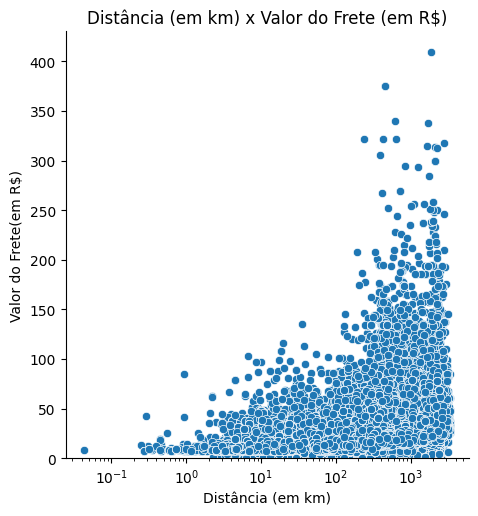

In [ ]:
sns.relplot(data = dist_orders, x = 'distance', y = 'freight_value')
plt.xscale('log')
## Distância em escala logarítmica
plt.ylim(0,)
plt.xlabel('Distância (em km)')
plt.ylabel('Valor do Frete(em R$)')
plt.title('Distância (em km) x Valor do Frete (em R$)')


## Mensurando numericamente a relação entre essas variáveis

In [ ]:
dist_orders[['freight_value', 'distance']].corr(method = 'pearson')


,freight_value,distance
freight_value,1.000000,0.378348
distance,0.378348,1.000000


In [ ]:
dist_orders[['freight_value', 'distance']].corr(method = 'spearman')

,freight_value,distance
freight_value,1.000000,0.597011
distance,0.597011,1.000000


In [ ]:
dist_orders[['freight_value', 'distance']].corr(method = 'kendall')

,freight_value,distance
freight_value,1.000000,0.439545
distance,0.439545,1.000000


## Julgando pelo gráfico e pelos coeficientes de correlação calculados, há relação positiva significativa (entre 0.38 e 0.6) entre Distância entre Vendedores e Clientes o Valor do Frete

## 3) Verificar os formatos de pagamento utilizados e verificar se há alguma predileção por algum tipo de pagamento para produtos mais baratos e/ou caros. Além disso, podemos estudar o número médio de parcelas (para opções de pagamento que tenham essa opção) e verificar se há alguma correlação significativa com o preço dos produtos.

In [ ]:
print(order_payments["order_id"].groupby(order_payments['payment_type']).count())

payment_type
boleto         19784
credit_card    76795
debit_card      1529
not_defined        3
voucher         5775
Name: order_id, dtype: int64


In [ ]:
print(order_payments["order_id"].groupby(order_payments['payment_installments']).count())

payment_installments
0         2
1     52546
2     12413
3     10461
4      7098
5      5239
6      3920
7      1626
8      4268
9       644
10     5328
11       23
12      133
13       16
14       15
15       74
16        5
17        8
18       27
20       17
21        3
22        1
23        1
24       18
Name: order_id, dtype: int64


<Axes: xlabel='payment_type', ylabel='payment_value'>

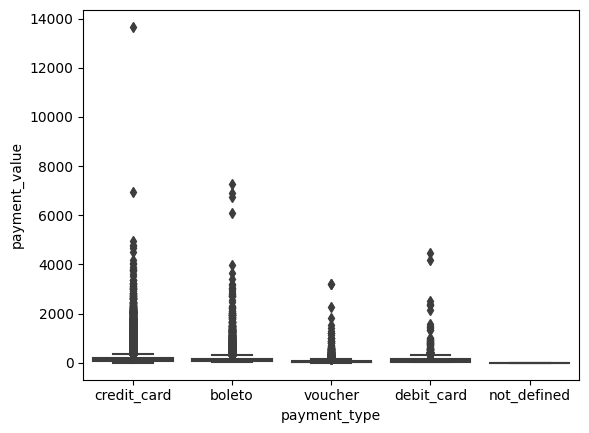

In [ ]:
sns.boxplot(order_payments, x = order_payments['payment_type'], y = order_payments['payment_value'])

In [ ]:
caro = order_payments.nlargest(50, columns = "payment_value")
caro["value"] = "caro"
barato = order_payments.nsmallest(50, columns = "payment_value")
barato["value"] = "barato"
caro_barato = caro.merge(barato, how  = "outer")

Text(0, 0.5, 'Frequência')

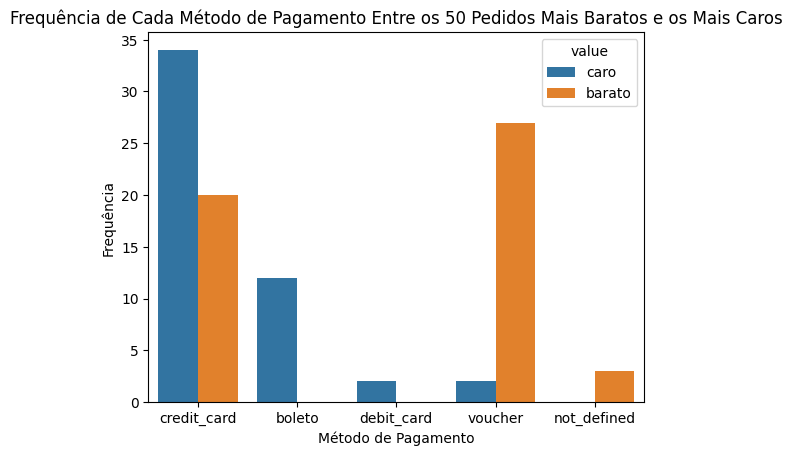

In [ ]:
sns.countplot(caro_barato, x = "payment_type", hue = "value")
plt.title("Frequência de Cada Método de Pagamento Entre os 50 Pedidos Mais Baratos e os Mais Caros")
plt.xlabel("Método de Pagamento")
plt.ylabel("Frequência")

Text(0, 0.5, 'Frequência')

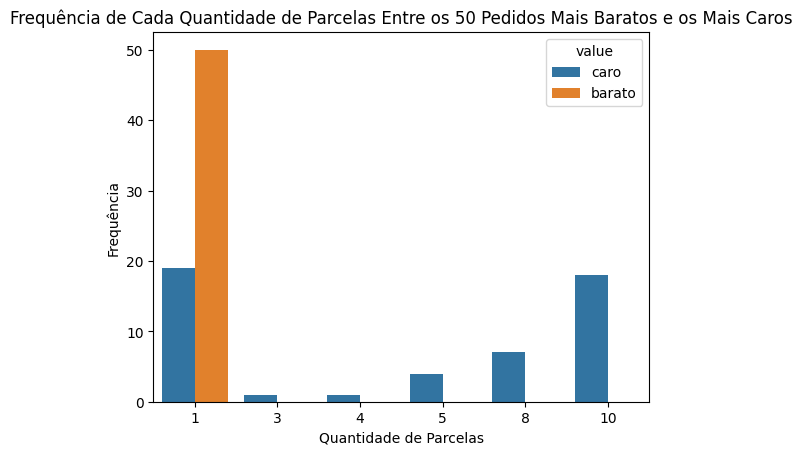

In [ ]:
sns.countplot(caro_barato, x = "payment_installments", hue = "value")
plt.title("Frequência de Cada Quantidade de Parcelas Entre os 50 Pedidos Mais Baratos e os Mais Caros")
plt.xlabel("Quantidade de Parcelas")
plt.ylabel("Frequência")

##5) Selecionar 50 empresas que mais venderam produtos e verificar, para estas, qual foi a proporção de pedidos atrasados.

In [ ]:
## Realizando Tratamento nas variáveis que serão utilizadas
dados['order_delivered_customer_date'] = pd.to_datetime(dados['order_delivered_customer_date'], format = '%Y-%m-%d %H:%M:%S')
dados['order_estimated_delivery_date'] = pd.to_datetime(dados['order_estimated_delivery_date'], format = '%Y-%m-%d %H:%M:%S')


In [ ]:
## Pedidos cuja data/horário de entrega foram posteriores ao prazo estimado de entrega foram tratados como pedidos em atraso
dados['atrasado'] = np.where(dados['order_delivered_customer_date'] < dados['order_estimated_delivery_date'], 1, 0)


In [ ]:
## Juntando os datasets que contém todas as colunas necessárias para responder esta pergunta

q5 = dados[['seller_id']]

maiores_vendedores = q5.groupby('seller_id').value_counts().sort_values(ascending = False).head(n=50).reset_index()
maiores_vendedores.columns = ['ID do Vendedor', 'Quantidade de Vendas']



In [ ]:
maiores_vendedores.columns = ['ID do Vendedor', 'Quantidade de Vendas']
maiores_vendedores.sum()

ID do Vendedor          4a3ca9315b744ce9f8e93743614938846560211a19b479...
Quantidade de Vendas                                                39535
dtype: object

In [ ]:
maiores_vendedores.columns



Index(['ID do Vendedor', 'Quantidade de Vendas'], dtype='object')

##7) Criar uma variável binária/booleana, verificando, para cada pedido, se ele tem ou não avaliação em comentário. Com esses dados obtidos, gerar um boxplot relacionando esta variável binária com a variável score numérico de avalição/review, verificando se há assossiação significativa entre essas duas variáveis (realizar teste de independência usando qui-quadrado entre essas duas variáveis.


In [ ]:
## Criando coluna para verificar se dado pedido tem ou não avaliação de texto
order_reviews['tem_av_texto'] = None
order_reviews['tem_av_texto'] = np.where(order_reviews['review_comment_message'].isna(), 'Não', 'Sim')



In [ ]:
print(order_reviews['tem_av_texto'].unique())
print(order_reviews['review_score'].unique())

['Não' 'Sim']
[4 5 1 3 2]


Text(0.5, 1.0, 'Comentário de Avaliação X Pontuação de Avaliação')

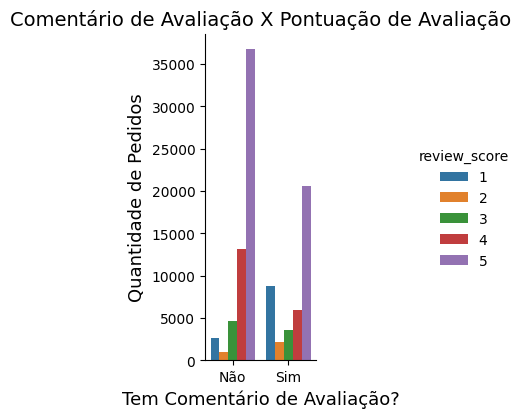

In [ ]:
sns.catplot(
    data=order_reviews, x="tem_av_texto", hue = 'review_score',
    kind="count", height=4, aspect=.6,
)
plt.xlabel('Tem Comentário de Avaliação?', fontsize = 13)
plt.ylabel('Quantidade de Pedidos', fontsize = 13)
plt.title('Comentário de Avaliação X Pontuação de Avaliação', fontsize = 14)

In [ ]:
## Realizando Teste Qui-Quadrado de Independência entre a Variável Binária e Variável Nota de Avaliação

tabela = pd.crosstab(index = order_reviews['tem_av_texto'], columns = order_reviews['review_score'])
print(tabela)

review_score     1     2     3      4      5
tem_av_texto                                
Não           2679  1006  4622  13166  36774
Sim           8745  2145  3557   5976  20554


In [ ]:
qui_quadrado = chi2_contingency(tabela)

## Para p-valor < 0.05, rejeitamos a hipótese nula de que essas variáveis sejam independentes

print(f'P-valor obtido: {qui_quadrado[1]}')

P-valor obtido: 0.0


## Com p-valor muito próximo de 0, rejeitamos a hipótese nula de que não haja correlação entre as variáveis Avaliação Numérica e a variável binária Tem/Não tem Comentário de Avaliação.

### Verificando também a correlação entre as variáveis review_comment_title e review_comment_message. Isto é, nesse caso verificaremos, para cada pedido, se ele possui algumas dessas avaliações. Caso tenha, criaremos uma outra coluna para cada uma dessas duas variáveis, que armazenará valor 1 caso sim, e valor 0, caso não tenha;

###8) Quando o comprador e o vendedor são da mesma cidade o frete é frequentemente igual a 0 (ou seja, não há valor de frete)? Além disso, é interessante gerar um gráfico que discrimine pedidos que não tiveram valor adicional de frente daquelas que tiveram valor adicional, com base em algum outro critério, variável de interesse.

In [ ]:
# criação do dataframe que contém todas as váriaveis de interesse pra trabalhar a questão
orders_customers = orders.merge(customers)
oc_order_items = orders_customers.merge(order_items)
ocoi_sellers = oc_order_items.merge(sellers)
ocois = ocoi_sellers.dropna()
ocois = ocois[["customer_state", "customer_city", "seller_state", "seller_city", "freight_value"]]
mesma_cidade = ocois[ocois["customer_city"] == ocois["seller_city"]]
mesma_cidade_estado = mesma_cidade[mesma_cidade["customer_state"] == mesma_cidade["seller_state"]]

In [ ]:
 # verificando o valor médio do frete quando o destinatário e o remetente são da mesma cidade

 mesma_cidade_estado.groupby("customer_city").mean().sort_values("freight_value")

<ipython-input-44-d804119161e2>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mesma_cidade_estado.groupby("customer_city").mean().sort_values("freight_value")


,freight_value
customer_city,
chapeco,2.100000
jaragua do sul,7.870000
petropolis,7.870000
sao goncalo,7.980000
sao bernardo do campo,8.119000
...,...
mogi das cruzes,22.973077
londrina,25.680000
caxias do sul,32.783333


###9) Qual categoria de produtos possui a maior nota de avaliação? ( Lembrar de juntar categorias de produtos 'redundantes').

In [ ]:
# Fundindo os dataframes para encontrar o que interliga as duas variáveis escolhidas
product_order_items = products.merge(order_items)
poi_order = product_order_items.merge(orders)
poio_review = poi_order.merge(order_reviews)
poior = poio_review[["product_category_name", "review_score"]]

In [ ]:
# Criando novas categorias de produtos juntando as que tinham na váriavel "product_category_name"
product_category = {
     "utilidades_domesticas":"itens_casa", "eletrodomesticos":"itens_casa", "moveis_decoracao":"itens_casa", "cama_mesa_banho":"itens_casa",
     "moveis_sala":"itens_casa", "moveis_cozinha_area_de_servico_jantar_e_jardim":"itens_casa", "eletrodomesticos_2":"itens_casa", "casa_conforto":"itens_casa",
     "portateis_casa_forno_e_cafe":"itens_casa", "moveis_quarto":"itens_casa", "casa_conforto_2":"itens_casa", "portateis_cozinha_e_preparadores_de_alimentos":"itens_casa",
     "moveis_colchao_e_estofado":"itens_casa", "ferramentas_jardim":"itens_casa", "cool_stuff":"itens_casa", "la_cuisine":"itens_casa", "moveis_escritorio":"itens_casa",
     "climatizacao":"itens_casa", "artigos_de_festas":"itens_casa", "artigos_de_natal":"itens_casa", "flores":"itens_casa", "beleza_saude":"moda", "fashion_calcados":"moda",
     "fashion_bolsas_e_acessorios":"moda", "fashion_underwear_e_moda_praia":"moda", "fashion_roupa_masculina":"moda", "fashion_roupa_feminina":"moda", "fashion_esporte":"moda",
     "fashion_roupa_infanto_juvenil":"moda", "perfumaria":"moda", "malas_acessorios":"moda", "relogios_presentes":"moda", "instrumentos_musicais":"musica", "audio":"musica",
     "musica":"musica", "dvds_blu_ray":"musica", "cds_dvds_musicais":"musica", "bebes":"infantil", "brinquedos":"infantil", "fraldas_higiene":"infantil", "eletronicos":"informatica",
     "informatica_acessorios":"informatica", "telefonia":"informatica", "cine_foto":"informatica", "eletroportateis":"informatica", "consoles_games":"informatica", "pcs":"informatica",
     "pc_gamer":"informatica", "tablets_impressao_imagem":"informatica", "telefonia_fixa":"informatica", "construcao_ferramentas_seguranca":"construcao", "casa_construcao":"construcao",
     "construcao_ferramentas_construcao":"construcao", "construcao_ferramentas_ferramentas":"construcao", "construcao_ferramentas_iluminacao":"construcao", "construcao_ferramentas_jardim":"construcao",
     "livros_interesse_geral":"livros", "livros_tecnicos":"livros", "livros_importados":"livros", "papelaria":"livros", "industria_comercio_e_negocios":"industria_comercio",
     "agro_industria_e_comercio":"industria_comercio", "market_place":"industria_comercio", "bebidas":"comida_bebida", "alimentos_bebidas":"comida_bebida", "alimentos":"comida_bebida",
     "seguros_e_servicos":"seguranca", "sinalizacao_e_seguranca":"seguranca", "artes":"arte", "artes_e_artesanato":"arte"
}
poior["product_category_name"] = poior["product_category_name"].replace(product_category)

<ipython-input-25-d468e6bd2c69>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  poior["product_category_name"] = poior["product_category_name"].replace(product_category)


In [ ]:
# Aferindo qual categoria possui a maior media de notas
poior.groupby("product_category_name").mean().sort_values("review_score", ascending = False)

,review_score
product_category_name,
livros,4.252218
comida_bebida,4.185925
pet_shop,4.185147
moda,4.118441
esporte_lazer,4.107986
infantil,4.091390
seguranca,4.070352
automotivo,4.065512
musica,4.053866


###10) Produtos com maior texto de descrição tendem a gerar um número maior de vendas ? (Verificar o tipo de variável que descreve o tamanho do texto. Com essa informação em mãos, utilizar coeficientes de correlação apropriados para a variável numérica número de vendas e a variável que descreve o tamanho do texto. Interessante também elaborar um gráfico que explicite melhor a relação entre essas duas variáveis.)

In [ ]:
poio_review.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,order_id,...,order_estimated_delivery_date,tempo_entrega,tempo_entrega_integral,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,tem_av_texto
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0,e17e4f88e31525f7deef66779844ddce,...,2018-05-09 00:00:00,2.0,2 days 21:37:58,d71da8fd8c6e3adef26be965f065b8a1,5,Vale a pena,Super adooorei o delineador ele é bem preto e ...,2018-04-28 00:00:00,2018-05-04 00:55:02,Sim
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0,5236307716393b7114b53ee991f36956,...,2018-02-22 00:00:00,15.0,15 days 18:15:53,19866247db89845ef558ef19a6c26fcd,5,NaN,Excelente apontador! Em 3 segundos uma ponta p...,2018-02-17 00:00:00,2018-02-18 23:24:14,Sim
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0,01f66e58769f84129811d43eefd187fb,...,2018-07-18 00:00:00,2.0,2 days 01:53:56,32921b4e09c9a19d61fe46ce04231b84,5,NaN,NaN,2018-07-14 00:00:00,2018-07-16 16:20:04,Não
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0,143d00a4f2dde4e0364ee1821577adb3,...,2018-08-08 00:00:00,3.0,3 days 05:42:50,70949d129965fb1ee32aaccec720a19e,1,produto divergente,modelo comprado: travesseiro memoria carinho B...,2018-08-07 00:00:00,2018-08-08 11:53:04,Sim
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0,86cafb8794cb99a9b1b77fc8e48fbbbb,...,2018-04-26 00:00:00,2.0,2 days 21:11:21,74c9c7d0bc153bbbc92e4c1597b8ba55,5,NaN,NaN,2018-04-17 00:00:00,2018-04-18 04:29:47,Não


In [ ]:
product_order_items = products.merge(order_items)
poi_order = product_order_items.merge(orders)
poio_review = poi_order.merge(order_reviews)
poior = poio_review[["product_id", "product_description_lenght", "order_id", 'product_category_name']]
poior = poior.dropna()
poior.groupby("order_id").count()

,product_id,product_description_lenght,product_category_name
order_id,,,
00010242fe8c5a6d1ba2dd792cb16214,1,1,1
00018f77f2f0320c557190d7a144bdd3,1,1,1
000229ec398224ef6ca0657da4fc703e,1,1,1
00024acbcdf0a6daa1e931b038114c75,1,1,1
00042b26cf59d7ce69dfabb4e55b4fd9,1,1,1
...,...,...,...
fffc94f6ce00a00581880bf54a75a037,1,1,1
fffcd46ef2263f404302a634eb57f7eb,1,1,1
fffce4705a9662cd70adb13d4a31832d,1,1,1


In [ ]:
poior.groupby("order_id").count()
poior['Count'] = poior['product_id'].groupby(poior['product_id']).transform('count')
poior.groupby("product_id").mean().sort_values("Count", ascending = False)

<ipython-input-40-102c04f7c14c>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  poior.groupby("product_id").mean().sort_values("Count", ascending = False)


,product_description_lenght,Count
product_id,,
aca2eb7d00ea1a7b8ebd4e68314663af,903.0,524.0
422879e10f46682990de24d770e7f83d,348.0,486.0
99a4788cb24856965c36a24e339b6058,245.0,482.0
389d119b48cf3043d311335e499d9c6b,341.0,391.0
368c6c730842d78016ad823897a372db,366.0,388.0
...,...,...
6d3b335d1fba472b61c01ba542307f62,601.0,1.0
6d377b5a340a90e525d388010b3062cc,344.0,1.0
6d313b6e250189718db2169e5e3a38c2,1680.0,1.0


In [ ]:
poior.corr()

<ipython-input-41-f3d47be2a2ad>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  poior.corr()


,product_description_lenght,Count
product_description_lenght,1.000000,-0.033457
Count,-0.033457,1.000000


Text(0, 0.5, 'Número de Vendas')

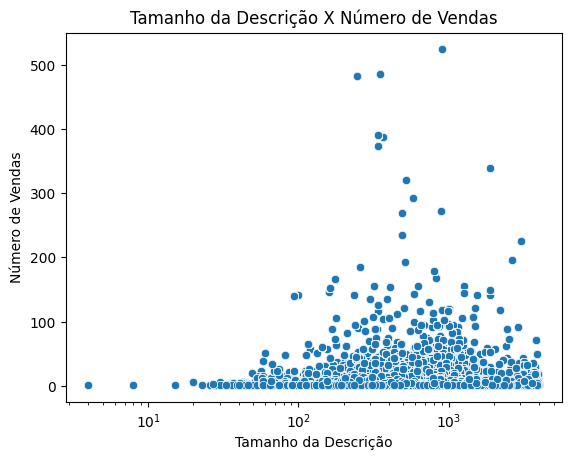

In [ ]:
sns.scatterplot(x = poior["product_description_lenght"], y = poior["Count"])
plt.xscale('log')
plt.title("Tamanho da Descrição X Número de Vendas")
plt.xlabel("Tamanho da Descrição")
plt.ylabel("Número de Vendas")

##11) Qual categoria de produtos possui em média descrição maior ? ( Mesmo desafio da questão 9)

In [ ]:
ooi = order_reviews.merge(order_items)
ooip = ooi.merge(products)
ooip = ooip[["review_comment_message", "product_category_name"]]
ooip['review_comment_message'] = order_reviews['review_comment_message'].fillna(" ")
ooip["tamanho_review"] = ooip['review_comment_message'].str.len()
ooip["product_category_name"] = ooip["product_category_name"].replace(product_category)

ooip.groupby("product_category_name").mean().sort_values("tamanho_review", ascending = False)

<ipython-input-36-70354070d461>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ooip['review_comment_message'] = order_reviews['review_comment_message'].fillna(" ")
<ipython-input-36-70354070d461>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ooip["tamanho_review"] = ooip['review_comment_message'].str.len()
<ipython-input-36-70354070d461>:8: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify num

,tamanho_review
product_category_name,
seguranca,32.892086
pet_shop,31.909367
musica,30.994071
automotivo,29.495645
infantil,29.478943
informatica,29.408850
livros,29.136005
itens_casa,29.027306
industria_comercio,29.011527


## 12) As dimensões de um produto (peso, altura ou largura) tendem a ter um frete mais caro ? Além disso, mais demorado tende a ser a entrega?

In [ ]:
poi = products.merge(order_items)
poi = poi[["product_weight_g", "product_length_cm", "product_height_cm", "product_width_cm", "freight_value"]]
print(poi.corr())

                   product_weight_g  product_length_cm  product_height_cm  \
product_weight_g           1.000000           0.460919           0.583277   
product_length_cm          0.460919           1.000000           0.192895   
product_height_cm          0.583277           0.192895           1.000000   
product_width_cm           0.506609           0.532537           0.281224   
freight_value              0.610420           0.309086           0.391831   

                   product_width_cm  freight_value  
product_weight_g           0.506609       0.610420  
product_length_cm          0.532537       0.309086  
product_height_cm          0.281224       0.391831  
product_width_cm           1.000000       0.323777  
freight_value              0.323777       1.000000  


Text(0, 0.5, 'Valor do Frete')

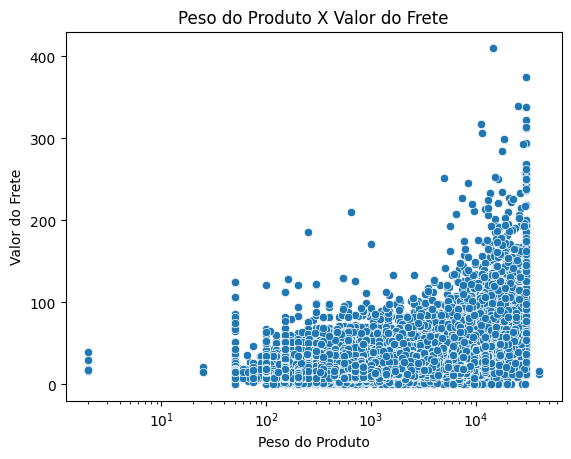

In [ ]:
sns.scatterplot(data = poi, x = "product_weight_g", y ="freight_value")
plt.xscale("log")
plt.title("Peso do Produto X Valor do Frete")
plt.xlabel("Peso do Produto")
plt.ylabel("Valor do Frete")

In [ ]:
poi = products.merge(order_items)
poio = poi.merge(orders)
poio = poio[["product_weight_g", "product_length_cm", "product_height_cm", "product_width_cm", "order_approved_at", "order_delivered_customer_date"]]

In [ ]:
data_aprovado = pd.to_datetime(poio["order_approved_at"], format = '%Y-%m-%d %H:%M:%S')
data_aprovado_dias = data_aprovado.dt.year*365 + data_aprovado.dt.month*30 + data_aprovado.dt.day + (data_aprovado.dt.hour)/3600/24
data_entregue = pd.to_datetime(poio["order_delivered_customer_date"], format = '%Y-%m-%d %H:%M:%S')
data_entregue_dias = data_entregue.dt.year*365 + data_entregue.dt.month*30 + data_entregue.dt.day + (data_entregue.dt.hour)/3600/24
dias_frete = data_entregue_dias - data_aprovado_dias
poio["delivery_time"] = dias_frete
poio.corr()

<ipython-input-33-aca3a437fa1c>:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  poio.corr()


,product_weight_g,product_length_cm,product_height_cm,product_width_cm,delivery_time
product_weight_g,1.000000,0.460919,0.583277,0.506609,0.083766
product_length_cm,0.460919,1.000000,0.192895,0.532537,0.067551
product_height_cm,0.583277,0.192895,1.000000,0.281224,0.065182
product_width_cm,0.506609,0.532537,0.281224,1.000000,0.039009
delivery_time,0.083766,0.067551,0.065182,0.039009,1.000000


##13) Que categoria de produto em média possui o maior número de parcelas? ( Mesmo desafio das questões 9 e 11).

In [ ]:
product_category_name = poior["product_category_name"]
order_payments["product_category_name"] = product_category_name
order_payments.groupby("product_category_name").mean().sort_values("payment_installments", ascending = False)

<ipython-input-30-312c830f49f2>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  order_payments.groupby("product_category_name").mean().sort_values("payment_installments", ascending = False)


,payment_sequential,payment_installments,payment_value
product_category_name,,,
seguranca,1.190217,3.152174,124.197120
musica,1.082386,2.932765,158.007604
infantil,1.093468,2.921583,154.494103
industria_comercio,1.114927,2.895641,168.397715
construcao,1.082958,2.875113,156.783571
pet_shop,1.087918,2.870011,155.445194
itens_casa,1.091950,2.866882,154.126470
automotivo,1.102434,2.843560,153.776067
informatica,1.087787,2.843351,152.902129


##14) As empresas cadastradas que têm maior quantidade de vendas (selecionar, por exemplo, as 50 primeiras) tendem a se especializar em categorias específicas de produtos, ou então possuem um grande leque de categorias?

In [ ]:
soi = sellers.merge(order_items)
soip = soi.merge(products)
soip = soip.dropna()
soip = soip[["seller_id", "product_id", "product_category_name"]]
soip["product_category_name"] = soip["product_category_name"].replace(product_category)
value_count = soip["seller_id"].value_counts()
top_50 = value_count.nlargest(50).index.tolist()

In [ ]:
soip_top_50 = soip[soip["seller_id"].isin(top_50)]
soip_top_50.groupby(["seller_id", "product_category_name"]).count().sort_values("product_id", ascending = False).head(25)

,,product_id
seller_id,product_category_name,
6560211a19b47992c3666cc44a7e94c0,moda,1981
4a3ca9315b744ce9f8e9374361493884,itens_casa,1927
1f50f920176fa81dab994f9023523100,itens_casa,1882
cc419e0650a3c5ba77189a1882b7556a,moda,1748
7c67e1448b00f6e969d365cea6b010ab,itens_casa,1340
1025f0e2d44d7041d6cf58b6550e0bfa,itens_casa,1292
da8622b14eb17ae2831f4ac5b9dab84a,itens_casa,1281
ea8482cd71df3c1969d7b9473ff13abc,informatica,1178
7a67c85e85bb2ce8582c35f2203ad736,itens_casa,1069


##15) Quais são as categorias de produtos cujos produtos têm, em média, um maior comprimento? Produtos com maior volume tendem a ser mais caros?

In [ ]:
op = order_items.merge(products)
op = op[["price", "product_category_name", "product_weight_g", "product_length_cm", "product_height_cm", "product_width_cm"]]
op["product_category_name"] = op["product_category_name"].replace(product_category)
op.groupby("product_category_name").mean().sort_values("product_length_cm", ascending = False)
op["volume"] = op["product_length_cm"]*op["product_height_cm"]*op["product_width_cm"]
op.corr()

<ipython-input-26-d6aff1297ede>:6: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  op.corr()


,price,product_weight_g,product_length_cm,product_height_cm,product_width_cm,volume
price,1.000000,0.338819,0.145811,0.223602,0.172467,0.298754
product_weight_g,0.338819,1.000000,0.460919,0.583277,0.506609,0.802267
product_length_cm,0.145811,0.460919,1.000000,0.192895,0.532537,0.541464
product_height_cm,0.223602,0.583277,0.192895,1.000000,0.281224,0.723788
product_width_cm,0.172467,0.506609,0.532537,0.281224,1.000000,0.624864
volume,0.298754,0.802267,0.541464,0.723788,0.624864,1.000000


Text(0, 0.5, 'Valor do Produto')

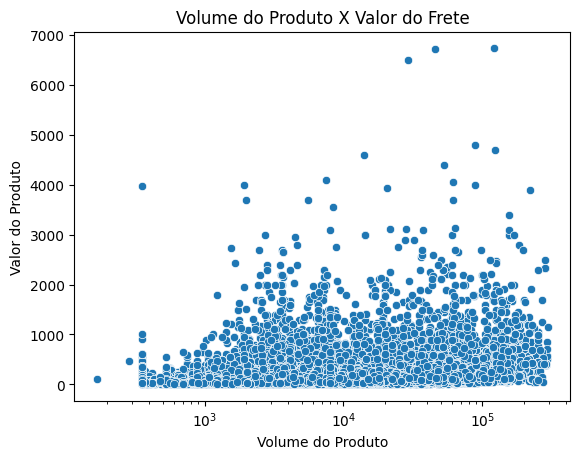

In [ ]:
sns.scatterplot(data = op, x = "volume", y = "price")
plt.xscale("log")
plt.title("Volume do Produto X Valor do Frete")
plt.xlabel("Volume do Produto")
plt.ylabel("Valor do Produto")

##16) Pedidos que tiveram um comentário de avalição antes mesmo do pedido ter chegado tendem a ter uma nota de avalição menor se comparado com as avaliações feitas dos pedidos que já foram entregues?

In [ ]:
oor = orders.merge(order_reviews)
oor = oor[["order_delivered_customer_date", "review_score", "review_creation_date"]]
data_entrega = pd.to_datetime(oor["order_delivered_customer_date"], format = '%Y-%m-%d %H:%M:%S')
data_review = pd.to_datetime(oor["review_creation_date"], format = '%Y-%m-%d %H:%M:%S')
avaliacao_anterior = oor[data_review < data_entrega]
avaliacao_posterior = oor[data_review > data_entrega]
avaliacao_anterior["tempo_av"] = "anterior"
avaliacao_posterior["tempo_av"] = "posterior"
avaliacoes = avaliacao_anterior.merge(avaliacao_posterior, how = "outer")
print(avaliacao_anterior["review_score"].mean())
print(avaliacao_posterior["review_score"].mean())

2.793028846153846
4.284317177614466


<ipython-input-19-e142ed40e178>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  avaliacao_anterior["tempo_av"] = "anterior"
<ipython-input-19-e142ed40e178>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  avaliacao_posterior["tempo_av"] = "posterior"


Text(0, 0.5, 'Número de Avaliações')

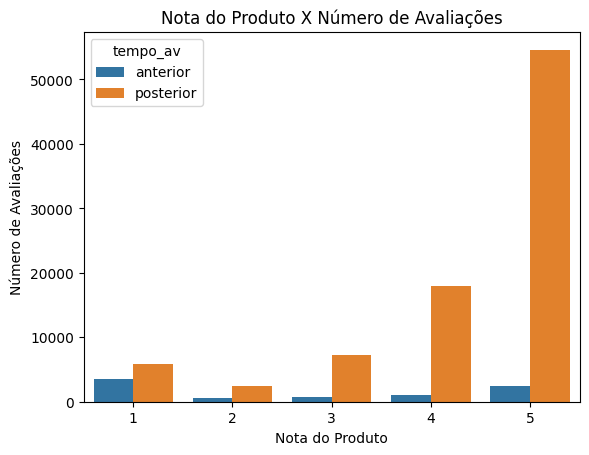

In [ ]:
sns.countplot(data =avaliacoes, x = "review_score", hue ="tempo_av")
plt.title("Nota do Produto X Número de Avaliações")
plt.xlabel("Nota do Produto")
plt.ylabel("Número de Avaliações")

### 17) Qual é o número total de clientes na base de dados?

In [ ]:
total_clientes = dados['customer_id'].nunique()
print(f'O número total de clientes na base de dados é igual a {total_clientes}.')

O número total de clientes na base de dados é igual a 99441.


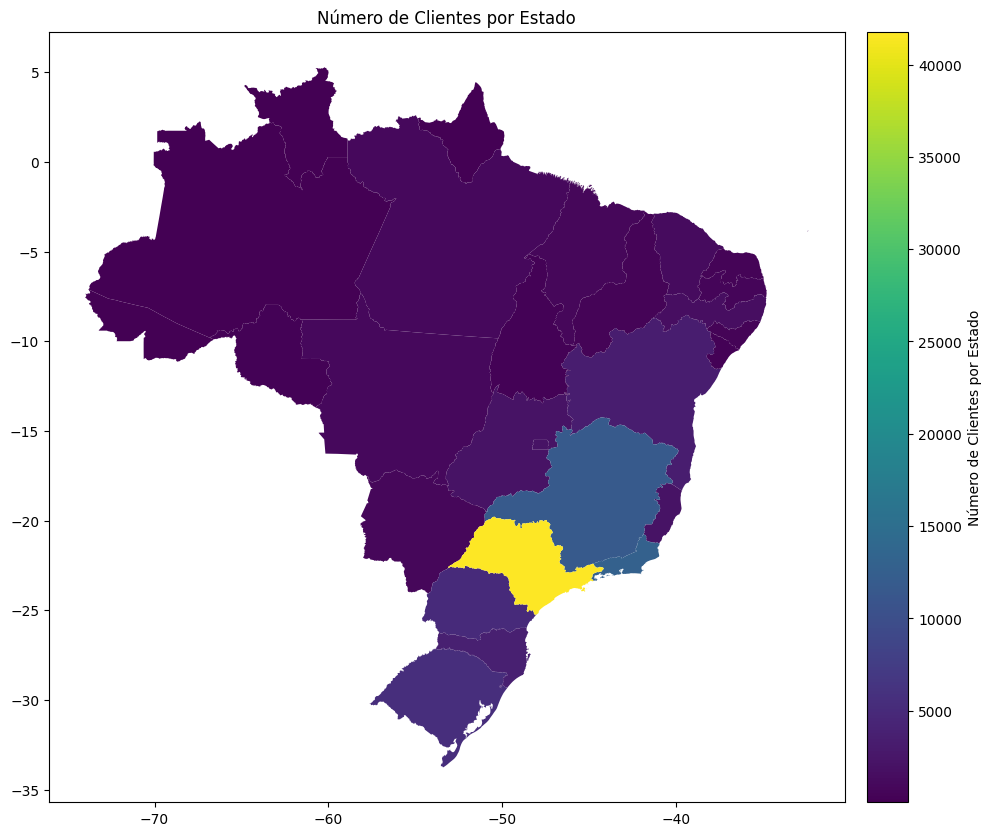

In [ ]:
clientesestado = dados.groupby('customer_state')['customer_id'].nunique().reset_index()
clientesestado.columns = ['sigla', 'numero_de_clientes']

shapefile_url = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"
estados = gpd.read_file(shapefile_url)

mapa = estados.merge(clientesestado, how='left', left_on='sigla', right_on='sigla')

fig, ax = plt.subplots(1, 1, figsize=(15, 10))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

mapa.plot(column='numero_de_clientes', ax=ax, legend=True, cax=cax,
          legend_kwds={'label': "Número de Clientes por Estado"})

ax.set_title("Número de Clientes por Estado")

plt.show()

### 18) Qual é o custo medio por pedido?


In [ ]:
custo_medio = dados.groupby('order_id')['payment_value'].sum().mean()
custo_medio = round(custo_medio,2)
print(f'O Custo medio por pedido é: R$ {custo_medio}')

O Custo medio por pedido é: R$ 206.95


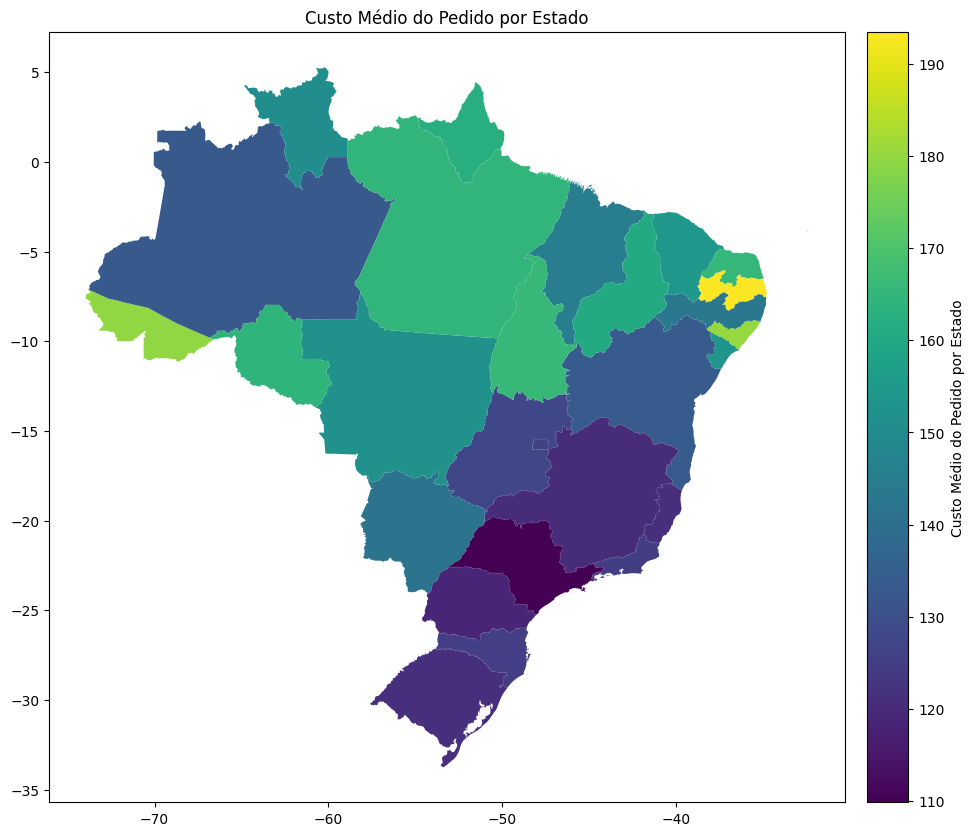

In [ ]:
customedioestado = dados.groupby('customer_state')['price'].mean().reset_index()

mapa = estados.merge(customedioestado, how='left', left_on='sigla', right_on='customer_state')

fig, ax = plt.subplots(1, 1, figsize=(15, 10))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

mapa.plot(column='price', ax=ax, legend=True, cax=cax,
          legend_kwds={'label': "Custo Médio do Pedido por Estado"})

ax.set_title("Custo Médio do Pedido por Estado")

plt.show()

### 19) Quais são os 5 produtos mais vendidos?



In [ ]:
cincoprodmais = dados.groupby('product_id')['order_item_id'].count().nlargest(5)
print('Os 5 produtos mais vendidos são: ')
print(cincoprodmais)

Os 5 produtos mais vendidos são: 
product_id
aca2eb7d00ea1a7b8ebd4e68314663af    536
99a4788cb24856965c36a24e339b6058    528
422879e10f46682990de24d770e7f83d    508
389d119b48cf3043d311335e499d9c6b    406
368c6c730842d78016ad823897a372db    398
Name: order_item_id, dtype: int64


### 20) Quais são os 10 principais estados onde os clientes estão localizados?



In [ ]:
topestclientes = dados['customer_state'].value_counts().nlargest(10)
print('Os 10 principais estados dos clientes são:')
print(topestclientes)

Os 10 principais estados dos clientes são:
SP    50265
RJ    15518
MG    13819
RS     6573
PR     6043
SC     4345
BA     4091
DF     2516
GO     2466
ES     2360
Name: customer_state, dtype: int64


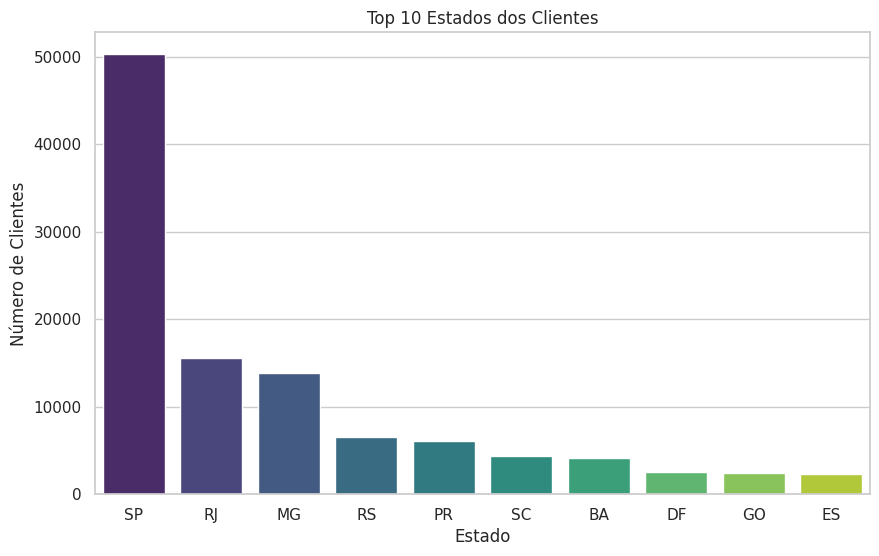

In [ ]:
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
topestclientes10 = dados['customer_state'].value_counts().nlargest(10)
sns.barplot(x=topestclientes10.index, y=topestclientes10.values, palette="viridis")
plt.title('Top 10 Estados dos Clientes')
plt.xlabel('Estado')
plt.ylabel('Número de Clientes')
plt.show()

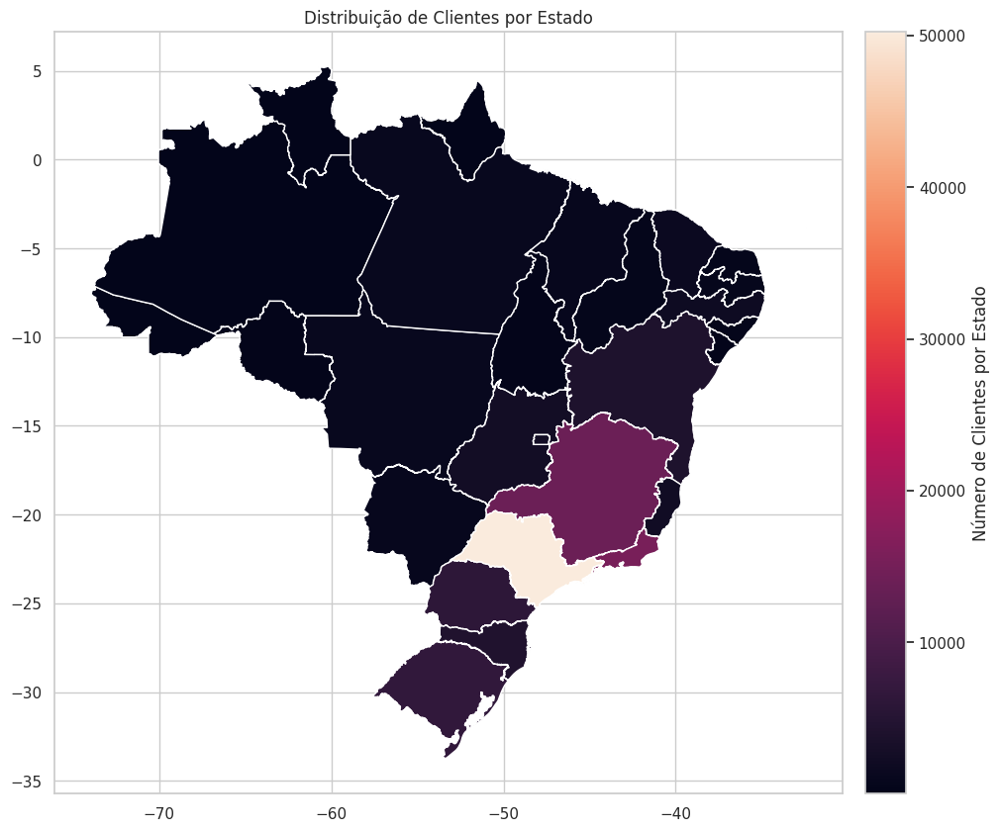

In [ ]:
clientesestado = dados['customer_state'].value_counts().reset_index()
clientesestado.columns = ['sigla', 'numero_de_clientes']

mapa = estados.merge(clientesestado, how='left', left_on='sigla', right_on='sigla')

fig, ax = plt.subplots(1, 1, figsize=(15, 10))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

mapa.plot(column='numero_de_clientes', ax=ax, legend=True, cax=cax,
          legend_kwds={'label': "Número de Clientes por Estado"})

ax.set_title("Distribuição de Clientes por Estado")

plt.show()

### 21) Qual é o vendedor com mais e menos produtos à venda?



In [ ]:
maiorvend = dados.groupby('seller_id')['product_id'].nunique().idxmax()
quantmaiorvendedor = dados.groupby('seller_id')['product_id'].nunique().max()
print(f'O vendedor com mais produtos à venda é: {maiorvend}')
print(f'Ele tem um total de {quantmaiorvendedor} produtos à venda.')

O vendedor com mais produtos à venda é: 4a3ca9315b744ce9f8e9374361493884
Ele tem um total de 399 produtos à venda.


In [ ]:
menorvend = dados.groupby('seller_id')['product_id'].nunique().idxmin()
quantmenorvendedor = dados.groupby('seller_id')['product_id'].nunique().min()

print(f'O vendedor com menos produtos à venda é: {menorvend}')
print(f'Ele tem um total de {quantmenorvendedor} produtos à venda.')

O vendedor com menos produtos à venda é: 0015a82c2db000af6aaaf3ae2ecb0532
Ele tem um total de 1 produtos à venda.


### 22) Qual é o produto mais caro e mais barato à venda?



In [ ]:
produto_mais_caro = dados.groupby('product_id')['price'].max().idxmax()
valormaiscaro = dados[dados['product_id'] == produto_mais_caro]['price'].max()

print(f'O produto mais caro à venda é: {produto_mais_caro}')
print(f'O valor do produto mais caro é: {valormaiscaro:.2f}')


O produto mais caro à venda é: 489ae2aa008f021502940f251d4cce7f
O valor do produto mais caro é: 6735.00


In [ ]:
produto_mais_barato = dados.groupby('product_id')['price'].min().idxmin()
valormaisbarato = dados[dados['product_id'] == produto_mais_barato]['price'].min()

print(f'O produto mais barato à venda é: {produto_mais_barato}')
print(f'O valor do produto mais barato é: {valormaisbarato:.2f}')

O produto mais barato à venda é: 8a3254bee785a526d548a81a9bc3c9be
O valor do produto mais barato é: 0.85


### 23) Qual é o mês com o maior número de pedidos?



In [ ]:
dados['order_date'] = pd.to_datetime(dados['order_purchase_timestamp'])
dados['mes'] = dados['order_date'].dt.month
mes_mais_pedidos = dados['mes'].value_counts().idxmax()

nome_mes = calendar.month_name[mes_mais_pedidos]
print(f'O mês com o maior número de pedidos é: {nome_mes}')

O mês com o maior número de pedidos é: August


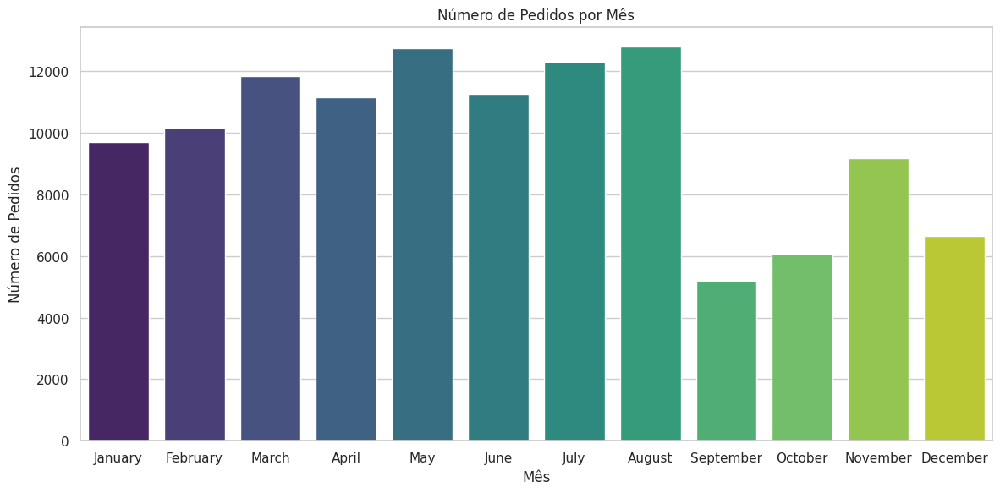

In [ ]:
sns.set(style="whitegrid")
pedidosmes = dados['mes'].value_counts().sort_index()
plt.figure(figsize=(12, 6))
sns.barplot(x=pedidosmes.index, y=pedidosmes.values, palette="viridis")
plt.title('Número de Pedidos por Mês')
plt.xlabel('Mês')
plt.ylabel('Número de Pedidos')
plt.xticks(range(0, 12), calendar.month_name[1:13])
plt.tight_layout()
plt.show()

### 24) Qual é a cidade com o maior número de clientes?



In [ ]:
cidades5clientes = dados['customer_city'].value_counts().nlargest(5)
print('As 5 cidades com o maior número de clientes são:')
print(cidades5clientes)

As 5 cidades com o maior número de clientes são:
sao paulo         18875
rio de janeiro     8311
belo horizonte     3299
brasilia           2500
curitiba           1827
Name: customer_city, dtype: int64


### 25) Qual é a categoria de produto mais popular?



In [ ]:
categoriamaispopular = dados['product_category_name'].value_counts().idxmax()
print(f'A categoria mais popular é: {categoriamaispopular}')

A categoria mais popular é: cama_mesa_banho


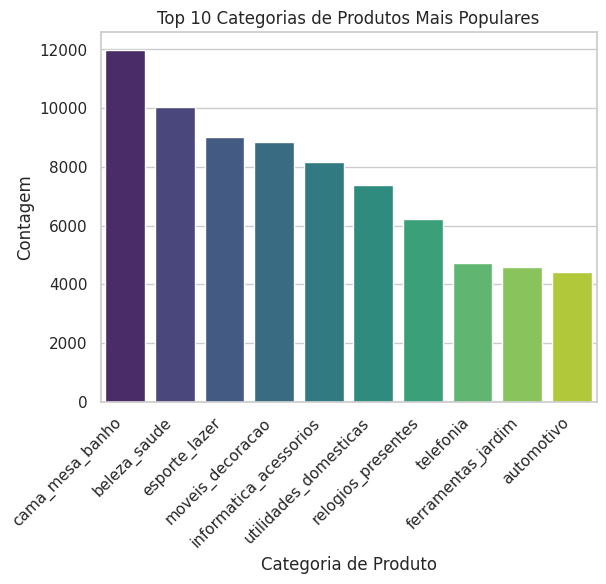

In [ ]:
top_10_cat = dados['product_category_name'].value_counts().nlargest(10)


sns.set(style="whitegrid")
sns.barplot(x=top_10_cat.index, y=top_10_cat.values, palette="viridis")
plt.title('Top 10 Categorias de Produtos Mais Populares')
plt.xlabel('Categoria de Produto')
plt.ylabel('Contagem')
plt.xticks(rotation=45, ha="right")
plt.show()

In [ ]:
categestado = dados.groupby(['customer_state', 'product_category_name'])['product_id'].nunique().reset_index()
idx = categestado.groupby(['customer_state'])['product_id'].transform(max) == categestado['product_id']
categorias_mais_populares_por_estado = categestado[idx]

# Exibindo a tabela
print(categorias_mais_populares_por_estado)

     customer_state   product_category_name  product_id
10               AC           esporte_lazer           9
34               AL            beleza_saude          46
75               AM            beleza_saude          15
109              AP            beleza_saude          10
136              BA            beleza_saude         237
237              CE      relogios_presentes          98
270              DF           esporte_lazer         172
314              ES         cama_mesa_banho         161
371              GO         cama_mesa_banho         174
451              MA  informatica_acessorios          64
483              MG         cama_mesa_banho         721
566              MS           esporte_lazer          58
602              MT            beleza_saude          79
656              PA            beleza_saude          86
705              PB            beleza_saude          52
753              PE            beleza_saude         152
811              PI            beleza_saude     

### 26) Qual é o método de pagamento mais comum?

In [ ]:
metodo_pagamento_comum = dados['payment_type'].value_counts().idxmax()
print(f'O metodo de pagamento predominantemente é: {metodo_pagamento_comum}')

O metodo de pagamento predominantemente é: credit_card


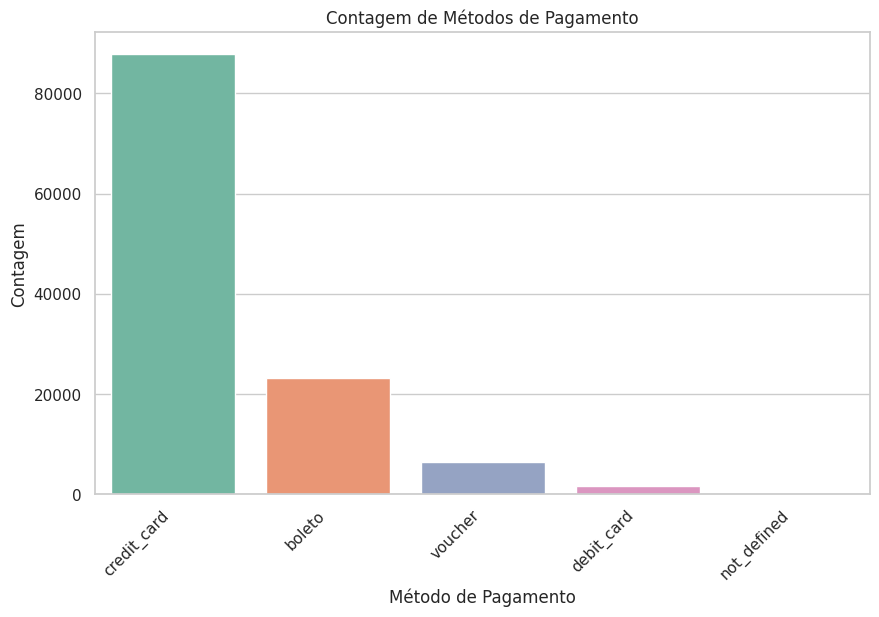

In [ ]:
sns.set(style="whitegrid")


contpagamento = dados['payment_type'].value_counts()
plt.figure(figsize=(10, 6))
sns.barplot(x=contpagamento.index, y=contpagamento.values, palette="Set2")
plt.title('Contagem de Métodos de Pagamento')
plt.xlabel('Método de Pagamento')
plt.ylabel('Contagem')
plt.xticks(rotation=45, ha="right")
plt.show()

In [ ]:
metodopagestado = dados.groupby(['customer_state', 'payment_type'])['order_id'].count().reset_index()
idx = metodopagestado.groupby(['customer_state'])['order_id'].transform(max) == metodopagestado['order_id']
metodo_mais_comum_por_estado = metodopagestado[idx]

# Exibindo a tabela
print(metodo_mais_comum_por_estado)

    customer_state payment_type  order_id
1               AC  credit_card        72
5               AL  credit_card       373
9               AM  credit_card       138
13              AP  credit_card        57
16              BA  credit_card      3021
20              CE  credit_card      1230
24              DF  credit_card      1942
28              ES  credit_card      1744
32              GO  credit_card      1793
36              MA  credit_card       585
40              MG  credit_card     10290
44              MS  credit_card       611
48              MT  credit_card       781
52              PA  credit_card       818
56              PB  credit_card       479
60              PE  credit_card      1480
64              PI  credit_card       423
68              PR  credit_card      4365
72              RJ  credit_card     11758
76              RN  credit_card       437
80              RO  credit_card       206
84              RR  credit_card        38
86              RS  credit_card   